# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [6, 48]
dtc_w1 = 25
dtc_w2 = 2.5

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 12 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=False
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=0.5, 
    limit_val_batches=0.5,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=None,
    model_level_metrics_helper_covariates=None
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: nmoswmo4
Name: bumbling-smoke-610
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/nmoswmo4
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240507_014601-nmoswmo4/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100-PCIE-40GB MIG 3g.20gb') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-c1581d36-4fc7-5d77-974f-dac8cbe41b19]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 226,390,439,182,402,298,552,129,472,381,429,361,247,293,44,206,447,300,285,528,245,266,154,55,329,138,108,288,98,80,178,205,54,328,219,177,270,146,100,194,383,455,333,971,139,377,168,195,276,323,222,131,392,250,267,375,316,626,306,298,238,587,239,139,263,338,282,742,335,372,253,365,363,366,123,221,216,144,58,115,194,482,315,260,336,216,163,233,393,174,142,101,271,397,154,163,442,76,154,283,180,376,100,256,188,220,315,129,147,273,268,110,115,358,343,364,254,43,43,218,220,260,76,197,313,247,189,240,287,205,959,284,180,524,297,153,485,356,501,467,212,462,456,278,349,251,360,240,301,281,272,236,258,404,393,258,236,191,162,625,254,229,135,151,159,169,537,259,379,220,275,404,607,402,295,257,229,226,178,182,217,183,193,252,598,344,340,360,368,7136,437,279,202,174,362,176,275,263,158,3

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 50,91,119,50,93,81,135,46,110,82,104,103,54,65,15,58,115,65,63,135,61,69,34,9,81,46,26,76,28,27,52,40,10,84,67,34,61,34,14,43,85,111,82,248,40,98,47,46,79,75,63,47,78,78,62,103,71,161,76,68,52,144,58,44,59,87,72,163,106,73,71,94,88,79,36,63,61,47,13,36,53,148,67,85,90,56,29,62,86,42,33,29,58,97,38,37,110,20,39,85,35,87,26,47,49,54,95,38,36,95,81,30,26,87,84,80,73,11,16,48,58,69,20,57,82,64,48,58,74,58,238,53,61,123,78,39,138,76,125,114,49,109,123,60,102,49,84,62,62,85,67,66,61,96,104,55,62,46,30,145,56,64,41,35,56,33,130,56,101,49,70,108,143,111,77,65,55,65,40,40,47,53,62,53,165,90,72,86,95,1771,93,70,43,37,84,41,56,69,42,91,30,69,74,71,71,128,66,62,80,24,12,39,63,79,20,62,69,90,41,48,72,58,56,59,75,47,81,69,48,55,65,116,42,83,13,40,33,139,132,133,96,71,81,69,216,112,23,52,59

Epoch 1/600:   0%|          | 1/600 [00:16<2:43:32, 16.38s/it]

Epoch 1/600:   0%|          | 1/600 [00:16<2:43:32, 16.38s/it, v_num=o4_1, total_loss_train=1.9e+3, kl_local_train=58]

Epoch 2/600:   0%|          | 1/600 [00:16<2:43:32, 16.38s/it, v_num=o4_1, total_loss_train=1.9e+3, kl_local_train=58]

Epoch 2/600:   0%|          | 2/600 [00:23<1:48:21, 10.87s/it, v_num=o4_1, total_loss_train=1.9e+3, kl_local_train=58]

Epoch 2/600:   0%|          | 2/600 [00:23<1:48:21, 10.87s/it, v_num=o4_1, total_loss_train=1.34e+3, kl_local_train=72.4]

Epoch 3/600:   0%|          | 2/600 [00:23<1:48:21, 10.87s/it, v_num=o4_1, total_loss_train=1.34e+3, kl_local_train=72.4]

Epoch 3/600:   0%|          | 3/600 [00:32<1:38:34,  9.91s/it, v_num=o4_1, total_loss_train=1.34e+3, kl_local_train=72.4]

Epoch 3/600:   0%|          | 3/600 [00:32<1:38:34,  9.91s/it, v_num=o4_1, total_loss_train=1.32e+3, kl_local_train=68.9]

Epoch 4/600:   0%|          | 3/600 [00:32<1:38:34,  9.91s/it, v_num=o4_1, total_loss_train=1.32e+3, kl_local_train=68.9]

Epoch 4/600:   1%|          | 4/600 [00:40<1:30:37,  9.12s/it, v_num=o4_1, total_loss_train=1.32e+3, kl_local_train=68.9]

Epoch 4/600:   1%|          | 4/600 [00:40<1:30:37,  9.12s/it, v_num=o4_1, total_loss_train=1.31e+3, kl_local_train=58.1]

Epoch 5/600:   1%|          | 4/600 [00:40<1:30:37,  9.12s/it, v_num=o4_1, total_loss_train=1.31e+3, kl_local_train=58.1]

Epoch 5/600:   1%|          | 5/600 [00:48<1:26:19,  8.71s/it, v_num=o4_1, total_loss_train=1.31e+3, kl_local_train=58.1]

Epoch 5/600:   1%|          | 5/600 [00:48<1:26:19,  8.71s/it, v_num=o4_1, total_loss_train=1.31e+3, kl_local_train=37.8]

Epoch 6/600:   1%|          | 5/600 [00:48<1:26:19,  8.71s/it, v_num=o4_1, total_loss_train=1.31e+3, kl_local_train=37.8]

Epoch 6/600:   1%|          | 6/600 [00:54<1:20:05,  8.09s/it, v_num=o4_1, total_loss_train=1.31e+3, kl_local_train=37.8]

Epoch 6/600:   1%|          | 6/600 [00:54<1:20:05,  8.09s/it, v_num=o4_1, total_loss_train=1.29e+3, kl_local_train=33.2]

Epoch 7/600:   1%|          | 6/600 [00:54<1:20:05,  8.09s/it, v_num=o4_1, total_loss_train=1.29e+3, kl_local_train=33.2]

Epoch 7/600:   1%|          | 7/600 [01:03<1:20:54,  8.19s/it, v_num=o4_1, total_loss_train=1.29e+3, kl_local_train=33.2]

Epoch 7/600:   1%|          | 7/600 [01:03<1:20:54,  8.19s/it, v_num=o4_1, total_loss_train=1.27e+3, kl_local_train=42.4]

Epoch 8/600:   1%|          | 7/600 [01:03<1:20:54,  8.19s/it, v_num=o4_1, total_loss_train=1.27e+3, kl_local_train=42.4]

Epoch 8/600:   1%|▏         | 8/600 [01:10<1:16:48,  7.78s/it, v_num=o4_1, total_loss_train=1.27e+3, kl_local_train=42.4]

Epoch 8/600:   1%|▏         | 8/600 [01:10<1:16:48,  7.78s/it, v_num=o4_1, total_loss_train=1.26e+3, kl_local_train=46.4]

Epoch 9/600:   1%|▏         | 8/600 [01:10<1:16:48,  7.78s/it, v_num=o4_1, total_loss_train=1.26e+3, kl_local_train=46.4]

Epoch 9/600:   2%|▏         | 9/600 [01:17<1:16:20,  7.75s/it, v_num=o4_1, total_loss_train=1.26e+3, kl_local_train=46.4]

Epoch 9/600:   2%|▏         | 9/600 [01:17<1:16:20,  7.75s/it, v_num=o4_1, total_loss_train=1.26e+3, kl_local_train=47.1]

Epoch 10/600:   2%|▏         | 9/600 [01:17<1:16:20,  7.75s/it, v_num=o4_1, total_loss_train=1.26e+3, kl_local_train=47.1]

Epoch 10/600:   2%|▏         | 10/600 [01:25<1:16:47,  7.81s/it, v_num=o4_1, total_loss_train=1.26e+3, kl_local_train=47.1]

Epoch 10/600:   2%|▏         | 10/600 [01:25<1:16:47,  7.81s/it, v_num=o4_1, total_loss_train=1.26e+3, kl_local_train=46.6]

Epoch 11/600:   2%|▏         | 10/600 [01:25<1:16:47,  7.81s/it, v_num=o4_1, total_loss_train=1.26e+3, kl_local_train=46.6]

Epoch 11/600:   2%|▏         | 11/600 [01:34<1:17:45,  7.92s/it, v_num=o4_1, total_loss_train=1.26e+3, kl_local_train=46.6]

Epoch 11/600:   2%|▏         | 11/600 [01:34<1:17:45,  7.92s/it, v_num=o4_1, total_loss_train=1.25e+3, kl_local_train=46.8]

Epoch 12/600:   2%|▏         | 11/600 [01:34<1:17:45,  7.92s/it, v_num=o4_1, total_loss_train=1.25e+3, kl_local_train=46.8]

Epoch 12/600:   2%|▏         | 12/600 [01:42<1:17:47,  7.94s/it, v_num=o4_1, total_loss_train=1.25e+3, kl_local_train=46.8]

Epoch 12/600:   2%|▏         | 12/600 [01:42<1:17:47,  7.94s/it, v_num=o4_1, total_loss_train=1.25e+3, kl_local_train=46.5]

Epoch 13/600:   2%|▏         | 12/600 [01:42<1:17:47,  7.94s/it, v_num=o4_1, total_loss_train=1.25e+3, kl_local_train=46.5]

Epoch 13/600:   2%|▏         | 13/600 [01:50<1:18:16,  8.00s/it, v_num=o4_1, total_loss_train=1.25e+3, kl_local_train=46.5]

Epoch 13/600:   2%|▏         | 13/600 [01:50<1:18:16,  8.00s/it, v_num=o4_1, total_loss_train=1.25e+3, kl_local_train=47.1]

Epoch 14/600:   2%|▏         | 13/600 [01:50<1:18:16,  8.00s/it, v_num=o4_1, total_loss_train=1.25e+3, kl_local_train=47.1]

Epoch 14/600:   2%|▏         | 14/600 [01:58<1:18:08,  8.00s/it, v_num=o4_1, total_loss_train=1.25e+3, kl_local_train=47.1]

Epoch 14/600:   2%|▏         | 14/600 [01:58<1:18:08,  8.00s/it, v_num=o4_1, total_loss_train=1.24e+3, kl_local_train=47.1]

Epoch 15/600:   2%|▏         | 14/600 [01:58<1:18:08,  8.00s/it, v_num=o4_1, total_loss_train=1.24e+3, kl_local_train=47.1]

Epoch 15/600:   2%|▎         | 15/600 [02:05<1:14:58,  7.69s/it, v_num=o4_1, total_loss_train=1.24e+3, kl_local_train=47.1]

Epoch 15/600:   2%|▎         | 15/600 [02:05<1:14:58,  7.69s/it, v_num=o4_1, total_loss_train=1.24e+3, kl_local_train=47.3]

Epoch 16/600:   2%|▎         | 15/600 [02:05<1:14:58,  7.69s/it, v_num=o4_1, total_loss_train=1.24e+3, kl_local_train=47.3]

Epoch 16/600:   3%|▎         | 16/600 [02:13<1:15:31,  7.76s/it, v_num=o4_1, total_loss_train=1.24e+3, kl_local_train=47.3]

Epoch 16/600:   3%|▎         | 16/600 [02:13<1:15:31,  7.76s/it, v_num=o4_1, total_loss_train=1.24e+3, kl_local_train=48.1]

Epoch 17/600:   3%|▎         | 16/600 [02:13<1:15:31,  7.76s/it, v_num=o4_1, total_loss_train=1.24e+3, kl_local_train=48.1]

Epoch 17/600:   3%|▎         | 17/600 [02:21<1:16:18,  7.85s/it, v_num=o4_1, total_loss_train=1.24e+3, kl_local_train=48.1]

Epoch 17/600:   3%|▎         | 17/600 [02:21<1:16:18,  7.85s/it, v_num=o4_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 18/600:   3%|▎         | 17/600 [02:21<1:16:18,  7.85s/it, v_num=o4_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 18/600:   3%|▎         | 18/600 [02:29<1:17:19,  7.97s/it, v_num=o4_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 18/600:   3%|▎         | 18/600 [02:29<1:17:19,  7.97s/it, v_num=o4_1, total_loss_train=1.23e+3, kl_local_train=48.8]

Epoch 19/600:   3%|▎         | 18/600 [02:29<1:17:19,  7.97s/it, v_num=o4_1, total_loss_train=1.23e+3, kl_local_train=48.8]

Epoch 19/600:   3%|▎         | 19/600 [02:37<1:16:23,  7.89s/it, v_num=o4_1, total_loss_train=1.23e+3, kl_local_train=48.8]

Epoch 19/600:   3%|▎         | 19/600 [02:37<1:16:23,  7.89s/it, v_num=o4_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 20/600:   3%|▎         | 19/600 [02:37<1:16:23,  7.89s/it, v_num=o4_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 20/600:   3%|▎         | 20/600 [02:45<1:19:03,  8.18s/it, v_num=o4_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 20/600:   3%|▎         | 20/600 [02:45<1:19:03,  8.18s/it, v_num=o4_1, total_loss_train=1.23e+3, kl_local_train=49.4]

Epoch 21/600:   3%|▎         | 20/600 [02:45<1:19:03,  8.18s/it, v_num=o4_1, total_loss_train=1.23e+3, kl_local_train=49.4]

Epoch 21/600:   4%|▎         | 21/600 [02:52<1:15:29,  7.82s/it, v_num=o4_1, total_loss_train=1.23e+3, kl_local_train=49.4]

Epoch 21/600:   4%|▎         | 21/600 [02:52<1:15:29,  7.82s/it, v_num=o4_1, total_loss_train=1.23e+3, kl_local_train=49.9]

Epoch 22/600:   4%|▎         | 21/600 [02:52<1:15:29,  7.82s/it, v_num=o4_1, total_loss_train=1.23e+3, kl_local_train=49.9]

Epoch 22/600:   4%|▎         | 22/600 [03:00<1:15:44,  7.86s/it, v_num=o4_1, total_loss_train=1.23e+3, kl_local_train=49.9]

Epoch 22/600:   4%|▎         | 22/600 [03:00<1:15:44,  7.86s/it, v_num=o4_1, total_loss_train=1.22e+3, kl_local_train=50.1]

Epoch 23/600:   4%|▎         | 22/600 [03:00<1:15:44,  7.86s/it, v_num=o4_1, total_loss_train=1.22e+3, kl_local_train=50.1]

Epoch 23/600:   4%|▍         | 23/600 [03:08<1:15:56,  7.90s/it, v_num=o4_1, total_loss_train=1.22e+3, kl_local_train=50.1]

Epoch 23/600:   4%|▍         | 23/600 [03:08<1:15:56,  7.90s/it, v_num=o4_1, total_loss_train=1.22e+3, kl_local_train=49.9]

Epoch 24/600:   4%|▍         | 23/600 [03:08<1:15:56,  7.90s/it, v_num=o4_1, total_loss_train=1.22e+3, kl_local_train=49.9]

Epoch 24/600:   4%|▍         | 24/600 [03:16<1:15:50,  7.90s/it, v_num=o4_1, total_loss_train=1.22e+3, kl_local_train=49.9]

Epoch 24/600:   4%|▍         | 24/600 [03:16<1:15:50,  7.90s/it, v_num=o4_1, total_loss_train=1.22e+3, kl_local_train=49.8]

Epoch 25/600:   4%|▍         | 24/600 [03:16<1:15:50,  7.90s/it, v_num=o4_1, total_loss_train=1.22e+3, kl_local_train=49.8]

Epoch 25/600:   4%|▍         | 25/600 [03:24<1:15:51,  7.92s/it, v_num=o4_1, total_loss_train=1.22e+3, kl_local_train=49.8]

Epoch 25/600:   4%|▍         | 25/600 [03:24<1:15:51,  7.92s/it, v_num=o4_1, total_loss_train=1.22e+3, kl_local_train=50.4]

Epoch 26/600:   4%|▍         | 25/600 [03:24<1:15:51,  7.92s/it, v_num=o4_1, total_loss_train=1.22e+3, kl_local_train=50.4]

Epoch 26/600:   4%|▍         | 26/600 [03:32<1:15:56,  7.94s/it, v_num=o4_1, total_loss_train=1.22e+3, kl_local_train=50.4]

Epoch 26/600:   4%|▍         | 26/600 [03:32<1:15:56,  7.94s/it, v_num=o4_1, total_loss_train=1.22e+3, kl_local_train=50.6]

Epoch 27/600:   4%|▍         | 26/600 [03:32<1:15:56,  7.94s/it, v_num=o4_1, total_loss_train=1.22e+3, kl_local_train=50.6]

Epoch 27/600:   4%|▍         | 27/600 [03:40<1:15:45,  7.93s/it, v_num=o4_1, total_loss_train=1.22e+3, kl_local_train=50.6]

Epoch 27/600:   4%|▍         | 27/600 [03:40<1:15:45,  7.93s/it, v_num=o4_1, total_loss_train=1.22e+3, kl_local_train=51]  

Epoch 28/600:   4%|▍         | 27/600 [03:40<1:15:45,  7.93s/it, v_num=o4_1, total_loss_train=1.22e+3, kl_local_train=51]

Epoch 28/600:   5%|▍         | 28/600 [03:48<1:14:16,  7.79s/it, v_num=o4_1, total_loss_train=1.22e+3, kl_local_train=51]

Epoch 28/600:   5%|▍         | 28/600 [03:48<1:14:16,  7.79s/it, v_num=o4_1, total_loss_train=1.21e+3, kl_local_train=51]

Epoch 29/600:   5%|▍         | 28/600 [03:48<1:14:16,  7.79s/it, v_num=o4_1, total_loss_train=1.21e+3, kl_local_train=51]

Epoch 29/600:   5%|▍         | 29/600 [03:55<1:14:31,  7.83s/it, v_num=o4_1, total_loss_train=1.21e+3, kl_local_train=51]

Epoch 29/600:   5%|▍         | 29/600 [03:56<1:14:31,  7.83s/it, v_num=o4_1, total_loss_train=1.21e+3, kl_local_train=51.2]

Epoch 30/600:   5%|▍         | 29/600 [03:56<1:14:31,  7.83s/it, v_num=o4_1, total_loss_train=1.21e+3, kl_local_train=51.2]

Epoch 30/600:   5%|▌         | 30/600 [04:03<1:14:44,  7.87s/it, v_num=o4_1, total_loss_train=1.21e+3, kl_local_train=51.2]

Epoch 30/600:   5%|▌         | 30/600 [04:03<1:14:44,  7.87s/it, v_num=o4_1, total_loss_train=1.21e+3, kl_local_train=51.1]

Epoch 31/600:   5%|▌         | 30/600 [04:03<1:14:44,  7.87s/it, v_num=o4_1, total_loss_train=1.21e+3, kl_local_train=51.1]

Epoch 31/600:   5%|▌         | 31/600 [04:11<1:14:44,  7.88s/it, v_num=o4_1, total_loss_train=1.21e+3, kl_local_train=51.1]

Epoch 31/600:   5%|▌         | 31/600 [04:11<1:14:44,  7.88s/it, v_num=o4_1, total_loss_train=1.21e+3, kl_local_train=51.3]

Epoch 32/600:   5%|▌         | 31/600 [04:11<1:14:44,  7.88s/it, v_num=o4_1, total_loss_train=1.21e+3, kl_local_train=51.3]

Epoch 32/600:   5%|▌         | 32/600 [04:20<1:17:43,  8.21s/it, v_num=o4_1, total_loss_train=1.21e+3, kl_local_train=51.3]

Epoch 32/600:   5%|▌         | 32/600 [04:20<1:17:43,  8.21s/it, v_num=o4_1, total_loss_train=1.21e+3, kl_local_train=51.2]

Epoch 33/600:   5%|▌         | 32/600 [04:20<1:17:43,  8.21s/it, v_num=o4_1, total_loss_train=1.21e+3, kl_local_train=51.2]

Epoch 33/600:   6%|▌         | 33/600 [04:28<1:16:47,  8.13s/it, v_num=o4_1, total_loss_train=1.21e+3, kl_local_train=51.2]

Epoch 33/600:   6%|▌         | 33/600 [04:28<1:16:47,  8.13s/it, v_num=o4_1, total_loss_train=1.21e+3, kl_local_train=51.1]

Epoch 34/600:   6%|▌         | 33/600 [04:28<1:16:47,  8.13s/it, v_num=o4_1, total_loss_train=1.21e+3, kl_local_train=51.1]

Epoch 34/600:   6%|▌         | 34/600 [04:35<1:13:15,  7.77s/it, v_num=o4_1, total_loss_train=1.21e+3, kl_local_train=51.1]

Epoch 34/600:   6%|▌         | 34/600 [04:35<1:13:15,  7.77s/it, v_num=o4_1, total_loss_train=1.21e+3, kl_local_train=51.2]

Epoch 35/600:   6%|▌         | 34/600 [04:35<1:13:15,  7.77s/it, v_num=o4_1, total_loss_train=1.21e+3, kl_local_train=51.2]

Epoch 35/600:   6%|▌         | 35/600 [04:43<1:12:23,  7.69s/it, v_num=o4_1, total_loss_train=1.21e+3, kl_local_train=51.2]

Epoch 35/600:   6%|▌         | 35/600 [04:43<1:12:23,  7.69s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51.1] 

Epoch 36/600:   6%|▌         | 35/600 [04:43<1:12:23,  7.69s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51.1]

Epoch 36/600:   6%|▌         | 36/600 [04:51<1:13:47,  7.85s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51.1]

Epoch 36/600:   6%|▌         | 36/600 [04:51<1:13:47,  7.85s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=50.8]

Epoch 37/600:   6%|▌         | 36/600 [04:51<1:13:47,  7.85s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=50.8]

Epoch 37/600:   6%|▌         | 37/600 [04:59<1:14:21,  7.92s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=50.8]

Epoch 37/600:   6%|▌         | 37/600 [04:59<1:14:21,  7.92s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51]  

Epoch 38/600:   6%|▌         | 37/600 [04:59<1:14:21,  7.92s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51]

Epoch 38/600:   6%|▋         | 38/600 [05:07<1:14:26,  7.95s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51]

Epoch 38/600:   6%|▋         | 38/600 [05:07<1:14:26,  7.95s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51.2]

Epoch 39/600:   6%|▋         | 38/600 [05:07<1:14:26,  7.95s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51.2]

Epoch 39/600:   6%|▋         | 39/600 [05:14<1:12:55,  7.80s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51.2]

Epoch 39/600:   6%|▋         | 39/600 [05:14<1:12:55,  7.80s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51.3]

Epoch 40/600:   6%|▋         | 39/600 [05:14<1:12:55,  7.80s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51.3]

Epoch 40/600:   7%|▋         | 40/600 [05:21<1:10:17,  7.53s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51.3]

Epoch 40/600:   7%|▋         | 40/600 [05:21<1:10:17,  7.53s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51.4]

Epoch 41/600:   7%|▋         | 40/600 [05:21<1:10:17,  7.53s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51.4]

Epoch 41/600:   7%|▋         | 41/600 [05:30<1:13:02,  7.84s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51.4]

Epoch 41/600:   7%|▋         | 41/600 [05:30<1:13:02,  7.84s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51.2]

Epoch 42/600:   7%|▋         | 41/600 [05:30<1:13:02,  7.84s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51.2]

Epoch 42/600:   7%|▋         | 42/600 [05:39<1:16:28,  8.22s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51.2]

Epoch 42/600:   7%|▋         | 42/600 [05:39<1:16:28,  8.22s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51.6]

Epoch 43/600:   7%|▋         | 42/600 [05:39<1:16:28,  8.22s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51.6]

Epoch 43/600:   7%|▋         | 43/600 [05:48<1:19:05,  8.52s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51.6]

Epoch 43/600:   7%|▋         | 43/600 [05:48<1:19:05,  8.52s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=52]  

Epoch 44/600:   7%|▋         | 43/600 [05:48<1:19:05,  8.52s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=52]

Epoch 44/600:   7%|▋         | 44/600 [05:57<1:18:20,  8.45s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=52]

Epoch 44/600:   7%|▋         | 44/600 [05:57<1:18:20,  8.45s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51.8]

Epoch 45/600:   7%|▋         | 44/600 [05:57<1:18:20,  8.45s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51.8]

Epoch 45/600:   8%|▊         | 45/600 [06:05<1:18:55,  8.53s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=51.8]

Epoch 45/600:   8%|▊         | 45/600 [06:05<1:18:55,  8.53s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=51.9]

Epoch 46/600:   8%|▊         | 45/600 [06:05<1:18:55,  8.53s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=51.9]

Epoch 46/600:   8%|▊         | 46/600 [06:13<1:17:11,  8.36s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=51.9]

Epoch 46/600:   8%|▊         | 46/600 [06:13<1:17:11,  8.36s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=52.2]

Epoch 47/600:   8%|▊         | 46/600 [06:13<1:17:11,  8.36s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=52.2]

Epoch 47/600:   8%|▊         | 47/600 [06:21<1:16:17,  8.28s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=52.2]

Epoch 47/600:   8%|▊         | 47/600 [06:21<1:16:17,  8.28s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=52]   

Epoch 48/600:   8%|▊         | 47/600 [06:21<1:16:17,  8.28s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=52]

Epoch 48/600:   8%|▊         | 48/600 [06:29<1:15:16,  8.18s/it, v_num=o4_1, total_loss_train=1.2e+3, kl_local_train=52]

Epoch 48/600:   8%|▊         | 48/600 [06:29<1:15:16,  8.18s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=51.6]

Epoch 49/600:   8%|▊         | 48/600 [06:29<1:15:16,  8.18s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=51.6]

Epoch 49/600:   8%|▊         | 49/600 [06:37<1:14:25,  8.10s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=51.6]

Epoch 49/600:   8%|▊         | 49/600 [06:37<1:14:25,  8.10s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=51.8]

Epoch 50/600:   8%|▊         | 49/600 [06:37<1:14:25,  8.10s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=51.8]

Epoch 50/600:   8%|▊         | 50/600 [06:45<1:13:42,  8.04s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=51.8]

Epoch 50/600:   8%|▊         | 50/600 [06:45<1:13:42,  8.04s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=51.6]

Epoch 51/600:   8%|▊         | 50/600 [06:45<1:13:42,  8.04s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=51.6]

Epoch 51/600:   8%|▊         | 51/600 [06:53<1:13:07,  7.99s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=51.6]

Epoch 51/600:   8%|▊         | 51/600 [06:53<1:13:07,  7.99s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=51.5]

Epoch 52/600:   8%|▊         | 51/600 [06:53<1:13:07,  7.99s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=51.5]

Epoch 52/600:   9%|▊         | 52/600 [07:01<1:12:23,  7.93s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=51.5]

Epoch 52/600:   9%|▊         | 52/600 [07:01<1:12:23,  7.93s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=50.5]

Epoch 53/600:   9%|▊         | 52/600 [07:01<1:12:23,  7.93s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=50.5]

Epoch 53/600:   9%|▉         | 53/600 [07:09<1:11:54,  7.89s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=50.5]

Epoch 53/600:   9%|▉         | 53/600 [07:09<1:11:54,  7.89s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=51.1]

Epoch 54/600:   9%|▉         | 53/600 [07:09<1:11:54,  7.89s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=51.1]

Epoch 54/600:   9%|▉         | 54/600 [07:15<1:09:06,  7.59s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=51.1]

Epoch 54/600:   9%|▉         | 54/600 [07:15<1:09:06,  7.59s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=50.8]

Epoch 55/600:   9%|▉         | 54/600 [07:15<1:09:06,  7.59s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=50.8]

Epoch 55/600:   9%|▉         | 55/600 [07:23<1:09:56,  7.70s/it, v_num=o4_1, total_loss_train=1.19e+3, kl_local_train=50.8]

Epoch 55/600:   9%|▉         | 55/600 [07:23<1:09:56,  7.70s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=50.6]

Epoch 56/600:   9%|▉         | 55/600 [07:23<1:09:56,  7.70s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=50.6]

Epoch 56/600:   9%|▉         | 56/600 [07:30<1:07:24,  7.43s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=50.6]

Epoch 56/600:   9%|▉         | 56/600 [07:30<1:07:24,  7.43s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=50]  

Epoch 57/600:   9%|▉         | 56/600 [07:30<1:07:24,  7.43s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=50]

Epoch 57/600:  10%|▉         | 57/600 [07:38<1:08:39,  7.59s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=50]

Epoch 57/600:  10%|▉         | 57/600 [07:38<1:08:39,  7.59s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=49.8]

Epoch 58/600:  10%|▉         | 57/600 [07:38<1:08:39,  7.59s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=49.8]

Epoch 58/600:  10%|▉         | 58/600 [07:46<1:09:18,  7.67s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=49.8]

Epoch 58/600:  10%|▉         | 58/600 [07:46<1:09:18,  7.67s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=49.9]

Epoch 59/600:  10%|▉         | 58/600 [07:46<1:09:18,  7.67s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=49.9]

Epoch 59/600:  10%|▉         | 59/600 [07:54<1:10:29,  7.82s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=49.9]

Epoch 59/600:  10%|▉         | 59/600 [07:54<1:10:29,  7.82s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=49.8]

Epoch 60/600:  10%|▉         | 59/600 [07:54<1:10:29,  7.82s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=49.8]

Epoch 60/600:  10%|█         | 60/600 [08:02<1:11:09,  7.91s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=49.8]

Epoch 60/600:  10%|█         | 60/600 [08:02<1:11:09,  7.91s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=49.4]

Epoch 61/600:  10%|█         | 60/600 [08:02<1:11:09,  7.91s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=49.4]

Epoch 61/600:  10%|█         | 61/600 [08:10<1:10:52,  7.89s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=49.4]

Epoch 61/600:  10%|█         | 61/600 [08:10<1:10:52,  7.89s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=49.4]

Epoch 62/600:  10%|█         | 61/600 [08:10<1:10:52,  7.89s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=49.4]

Epoch 62/600:  10%|█         | 62/600 [08:18<1:10:52,  7.90s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=49.4]

Epoch 62/600:  10%|█         | 62/600 [08:18<1:10:52,  7.90s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=49.4]

Epoch 63/600:  10%|█         | 62/600 [08:18<1:10:52,  7.90s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=49.4]

Epoch 63/600:  10%|█         | 63/600 [08:27<1:13:23,  8.20s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=49.4]

Epoch 63/600:  10%|█         | 63/600 [08:27<1:13:23,  8.20s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=49.1]

Epoch 64/600:  10%|█         | 63/600 [08:27<1:13:23,  8.20s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=49.1]

Epoch 64/600:  11%|█         | 64/600 [08:34<1:09:51,  7.82s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=49.1]

Epoch 64/600:  11%|█         | 64/600 [08:34<1:09:51,  7.82s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=48.9]

Epoch 65/600:  11%|█         | 64/600 [08:34<1:09:51,  7.82s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=48.9]

Epoch 65/600:  11%|█         | 65/600 [08:41<1:07:19,  7.55s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=48.9]

Epoch 65/600:  11%|█         | 65/600 [08:41<1:07:19,  7.55s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=48.6]

Epoch 66/600:  11%|█         | 65/600 [08:41<1:07:19,  7.55s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=48.6]

Epoch 66/600:  11%|█         | 66/600 [08:49<1:08:08,  7.66s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=48.6]

Epoch 66/600:  11%|█         | 66/600 [08:49<1:08:08,  7.66s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=48.4]

Epoch 67/600:  11%|█         | 66/600 [08:49<1:08:08,  7.66s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=48.4]

Epoch 67/600:  11%|█         | 67/600 [08:57<1:08:32,  7.72s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=48.4]

Epoch 67/600:  11%|█         | 67/600 [08:57<1:08:32,  7.72s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=48.4]

Epoch 68/600:  11%|█         | 67/600 [08:57<1:08:32,  7.72s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=48.4]

Epoch 68/600:  11%|█▏        | 68/600 [09:05<1:08:56,  7.78s/it, v_num=o4_1, total_loss_train=1.18e+3, kl_local_train=48.4]

Epoch 68/600:  11%|█▏        | 68/600 [09:05<1:08:56,  7.78s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=48]  

Epoch 69/600:  11%|█▏        | 68/600 [09:05<1:08:56,  7.78s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=48]

Epoch 69/600:  12%|█▏        | 69/600 [09:13<1:11:50,  8.12s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=48]

Epoch 69/600:  12%|█▏        | 69/600 [09:13<1:11:50,  8.12s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=48.1]

Epoch 70/600:  12%|█▏        | 69/600 [09:13<1:11:50,  8.12s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=48.1]

Epoch 70/600:  12%|█▏        | 70/600 [09:22<1:12:51,  8.25s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=48.1]

Epoch 70/600:  12%|█▏        | 70/600 [09:22<1:12:51,  8.25s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47.8]

Epoch 71/600:  12%|█▏        | 70/600 [09:22<1:12:51,  8.25s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47.8]

Epoch 71/600:  12%|█▏        | 71/600 [09:29<1:09:06,  7.84s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47.8]

Epoch 71/600:  12%|█▏        | 71/600 [09:29<1:09:06,  7.84s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47.9]

Epoch 72/600:  12%|█▏        | 71/600 [09:29<1:09:06,  7.84s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47.9]

Epoch 72/600:  12%|█▏        | 72/600 [09:37<1:09:15,  7.87s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47.9]

Epoch 72/600:  12%|█▏        | 72/600 [09:37<1:09:15,  7.87s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47.7]

Epoch 73/600:  12%|█▏        | 72/600 [09:37<1:09:15,  7.87s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47.7]

Epoch 73/600:  12%|█▏        | 73/600 [09:46<1:12:38,  8.27s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47.7]

Epoch 73/600:  12%|█▏        | 73/600 [09:46<1:12:38,  8.27s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47.7]

Epoch 74/600:  12%|█▏        | 73/600 [09:46<1:12:38,  8.27s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47.7]

Epoch 74/600:  12%|█▏        | 74/600 [09:54<1:12:21,  8.25s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47.7]

Epoch 74/600:  12%|█▏        | 74/600 [09:54<1:12:21,  8.25s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47.5]

Epoch 75/600:  12%|█▏        | 74/600 [09:54<1:12:21,  8.25s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47.5]

Epoch 75/600:  12%|█▎        | 75/600 [10:01<1:08:16,  7.80s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47.5]

Epoch 75/600:  12%|█▎        | 75/600 [10:01<1:08:16,  7.80s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47.3]

Epoch 76/600:  12%|█▎        | 75/600 [10:01<1:08:16,  7.80s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47.3]

Epoch 76/600:  13%|█▎        | 76/600 [10:09<1:08:25,  7.84s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47.3]

Epoch 76/600:  13%|█▎        | 76/600 [10:09<1:08:25,  7.84s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47.3]

Epoch 77/600:  13%|█▎        | 76/600 [10:09<1:08:25,  7.84s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47.3]

Epoch 77/600:  13%|█▎        | 77/600 [10:17<1:10:04,  8.04s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47.3]

Epoch 77/600:  13%|█▎        | 77/600 [10:17<1:10:04,  8.04s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47]  

Epoch 78/600:  13%|█▎        | 77/600 [10:17<1:10:04,  8.04s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47]

Epoch 78/600:  13%|█▎        | 78/600 [10:25<1:09:26,  7.98s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=47]

Epoch 78/600:  13%|█▎        | 78/600 [10:25<1:09:26,  7.98s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.9]

Epoch 79/600:  13%|█▎        | 78/600 [10:25<1:09:26,  7.98s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.9]

Epoch 79/600:  13%|█▎        | 79/600 [10:32<1:07:16,  7.75s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.9]

Epoch 79/600:  13%|█▎        | 79/600 [10:32<1:07:16,  7.75s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.6]

Epoch 80/600:  13%|█▎        | 79/600 [10:32<1:07:16,  7.75s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.6]

Epoch 80/600:  13%|█▎        | 80/600 [10:40<1:05:17,  7.53s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.6]

Epoch 80/600:  13%|█▎        | 80/600 [10:40<1:05:17,  7.53s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.6]

Epoch 81/600:  13%|█▎        | 80/600 [10:40<1:05:17,  7.53s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.6]

Epoch 81/600:  14%|█▎        | 81/600 [10:48<1:06:41,  7.71s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.6]

Epoch 81/600:  14%|█▎        | 81/600 [10:48<1:06:41,  7.71s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.8]

Epoch 82/600:  14%|█▎        | 81/600 [10:48<1:06:41,  7.71s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.8]

Epoch 82/600:  14%|█▎        | 82/600 [10:56<1:09:02,  8.00s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.8]

Epoch 82/600:  14%|█▎        | 82/600 [10:56<1:09:02,  8.00s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.5]

Epoch 83/600:  14%|█▎        | 82/600 [10:56<1:09:02,  8.00s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.5]

Epoch 83/600:  14%|█▍        | 83/600 [11:04<1:08:52,  7.99s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.5]

Epoch 83/600:  14%|█▍        | 83/600 [11:04<1:08:52,  7.99s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.4]

Epoch 84/600:  14%|█▍        | 83/600 [11:04<1:08:52,  7.99s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.4]

Epoch 84/600:  14%|█▍        | 84/600 [11:12<1:09:00,  8.02s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.4]

Epoch 84/600:  14%|█▍        | 84/600 [11:12<1:09:00,  8.02s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.2]

Epoch 85/600:  14%|█▍        | 84/600 [11:12<1:09:00,  8.02s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.2]

Epoch 85/600:  14%|█▍        | 85/600 [11:20<1:08:14,  7.95s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.2]

Epoch 85/600:  14%|█▍        | 85/600 [11:20<1:08:14,  7.95s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=46.1]

Epoch 86/600:  14%|█▍        | 85/600 [11:20<1:08:14,  7.95s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=46.1]

Epoch 86/600:  14%|█▍        | 86/600 [11:28<1:08:05,  7.95s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=46.1]

Epoch 86/600:  14%|█▍        | 86/600 [11:28<1:08:05,  7.95s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.2]

Epoch 87/600:  14%|█▍        | 86/600 [11:28<1:08:05,  7.95s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.2]

Epoch 87/600:  14%|█▍        | 87/600 [11:36<1:07:48,  7.93s/it, v_num=o4_1, total_loss_train=1.17e+3, kl_local_train=46.2]

Epoch 87/600:  14%|█▍        | 87/600 [11:36<1:07:48,  7.93s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.9]

Epoch 88/600:  14%|█▍        | 87/600 [11:36<1:07:48,  7.93s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.9]

Epoch 88/600:  15%|█▍        | 88/600 [11:44<1:07:44,  7.94s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.9]

Epoch 88/600:  15%|█▍        | 88/600 [11:44<1:07:44,  7.94s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.9]

Epoch 89/600:  15%|█▍        | 88/600 [11:44<1:07:44,  7.94s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.9]

Epoch 89/600:  15%|█▍        | 89/600 [11:53<1:11:14,  8.37s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.9]

Epoch 89/600:  15%|█▍        | 89/600 [11:53<1:11:14,  8.37s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.6]

Epoch 90/600:  15%|█▍        | 89/600 [11:53<1:11:14,  8.37s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.6]

Epoch 90/600:  15%|█▌        | 90/600 [12:01<1:10:08,  8.25s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.6]

Epoch 90/600:  15%|█▌        | 90/600 [12:01<1:10:08,  8.25s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.6]

Epoch 91/600:  15%|█▌        | 90/600 [12:01<1:10:08,  8.25s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.6]

Epoch 91/600:  15%|█▌        | 91/600 [12:10<1:10:34,  8.32s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.6]

Epoch 91/600:  15%|█▌        | 91/600 [12:10<1:10:34,  8.32s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.3]

Epoch 92/600:  15%|█▌        | 91/600 [12:10<1:10:34,  8.32s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.3]

Epoch 92/600:  15%|█▌        | 92/600 [12:19<1:11:40,  8.47s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.3]

Epoch 92/600:  15%|█▌        | 92/600 [12:19<1:11:40,  8.47s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.4]

Epoch 93/600:  15%|█▌        | 92/600 [12:19<1:11:40,  8.47s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.4]

Epoch 93/600:  16%|█▌        | 93/600 [12:27<1:10:40,  8.36s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.4]

Epoch 93/600:  16%|█▌        | 93/600 [12:27<1:10:40,  8.36s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.1]

Epoch 94/600:  16%|█▌        | 93/600 [12:27<1:10:40,  8.36s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.1]

Epoch 94/600:  16%|█▌        | 94/600 [12:35<1:09:22,  8.23s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.1]

Epoch 94/600:  16%|█▌        | 94/600 [12:35<1:09:22,  8.23s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.1]

Epoch 95/600:  16%|█▌        | 94/600 [12:35<1:09:22,  8.23s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.1]

Epoch 95/600:  16%|█▌        | 95/600 [12:43<1:08:26,  8.13s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45.1]

Epoch 95/600:  16%|█▌        | 95/600 [12:43<1:08:26,  8.13s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45]  

Epoch 96/600:  16%|█▌        | 95/600 [12:43<1:08:26,  8.13s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45]

Epoch 96/600:  16%|█▌        | 96/600 [12:50<1:07:53,  8.08s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45]

Epoch 96/600:  16%|█▌        | 96/600 [12:50<1:07:53,  8.08s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45]

Epoch 97/600:  16%|█▌        | 96/600 [12:50<1:07:53,  8.08s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45]

Epoch 97/600:  16%|█▌        | 97/600 [12:58<1:07:30,  8.05s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=45]

Epoch 97/600:  16%|█▌        | 97/600 [12:58<1:07:30,  8.05s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.9]

Epoch 98/600:  16%|█▌        | 97/600 [12:58<1:07:30,  8.05s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.9]

Epoch 98/600:  16%|█▋        | 98/600 [13:05<1:04:34,  7.72s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.9]

Epoch 98/600:  16%|█▋        | 98/600 [13:05<1:04:34,  7.72s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.8]

Epoch 99/600:  16%|█▋        | 98/600 [13:05<1:04:34,  7.72s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.8]

Epoch 99/600:  16%|█▋        | 99/600 [13:13<1:05:01,  7.79s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.8]

Epoch 99/600:  16%|█▋        | 99/600 [13:13<1:05:01,  7.79s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.6]

Epoch 100/600:  16%|█▋        | 99/600 [13:13<1:05:01,  7.79s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.6]

Epoch 100/600:  17%|█▋        | 100/600 [13:21<1:04:55,  7.79s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.6]

Epoch 100/600:  17%|█▋        | 100/600 [13:21<1:04:55,  7.79s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.5]

Epoch 101/600:  17%|█▋        | 100/600 [13:21<1:04:55,  7.79s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.5]

Epoch 101/600:  17%|█▋        | 101/600 [13:29<1:06:11,  7.96s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.5]

Epoch 101/600:  17%|█▋        | 101/600 [13:30<1:06:11,  7.96s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.5]

Epoch 102/600:  17%|█▋        | 101/600 [13:30<1:06:11,  7.96s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.5]

Epoch 102/600:  17%|█▋        | 102/600 [13:37<1:05:57,  7.95s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.5]

Epoch 102/600:  17%|█▋        | 102/600 [13:37<1:05:57,  7.95s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.4]

Epoch 103/600:  17%|█▋        | 102/600 [13:37<1:05:57,  7.95s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.4]

Epoch 103/600:  17%|█▋        | 103/600 [13:46<1:06:22,  8.01s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.4]

Epoch 103/600:  17%|█▋        | 103/600 [13:46<1:06:22,  8.01s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.3]

Epoch 104/600:  17%|█▋        | 103/600 [13:46<1:06:22,  8.01s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.3]

Epoch 104/600:  17%|█▋        | 104/600 [13:54<1:06:06,  8.00s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.3]

Epoch 104/600:  17%|█▋        | 104/600 [13:54<1:06:06,  8.00s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.2]

Epoch 105/600:  17%|█▋        | 104/600 [13:54<1:06:06,  8.00s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.2]

Epoch 105/600:  18%|█▊        | 105/600 [14:02<1:05:59,  8.00s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.2]

Epoch 105/600:  18%|█▊        | 105/600 [14:02<1:05:59,  8.00s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.1]

Epoch 106/600:  18%|█▊        | 105/600 [14:02<1:05:59,  8.00s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.1]

Epoch 106/600:  18%|█▊        | 106/600 [14:11<1:08:43,  8.35s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44.1]

Epoch 106/600:  18%|█▊        | 106/600 [14:11<1:08:43,  8.35s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44]  

Epoch 107/600:  18%|█▊        | 106/600 [14:11<1:08:43,  8.35s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44]

Epoch 107/600:  18%|█▊        | 107/600 [14:19<1:07:37,  8.23s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=44]

Epoch 107/600:  18%|█▊        | 107/600 [14:19<1:07:37,  8.23s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.9]

Epoch 108/600:  18%|█▊        | 107/600 [14:19<1:07:37,  8.23s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.9]

Epoch 108/600:  18%|█▊        | 108/600 [14:28<1:10:20,  8.58s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.9]

Epoch 108/600:  18%|█▊        | 108/600 [14:28<1:10:20,  8.58s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.8]

Epoch 109/600:  18%|█▊        | 108/600 [14:28<1:10:20,  8.58s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.8]

Epoch 109/600:  18%|█▊        | 109/600 [14:36<1:08:36,  8.38s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.8]

Epoch 109/600:  18%|█▊        | 109/600 [14:36<1:08:36,  8.38s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.8]

Epoch 110/600:  18%|█▊        | 109/600 [14:36<1:08:36,  8.38s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.8]

Epoch 110/600:  18%|█▊        | 110/600 [14:44<1:07:28,  8.26s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.8]

Epoch 110/600:  18%|█▊        | 110/600 [14:44<1:07:28,  8.26s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.8]

Epoch 111/600:  18%|█▊        | 110/600 [14:44<1:07:28,  8.26s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.8]

Epoch 111/600:  18%|█▊        | 111/600 [14:52<1:06:33,  8.17s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.8]

Epoch 111/600:  18%|█▊        | 111/600 [14:52<1:06:33,  8.17s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.6]

Epoch 112/600:  18%|█▊        | 111/600 [14:52<1:06:33,  8.17s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.6]

Epoch 112/600:  19%|█▊        | 112/600 [14:59<1:03:25,  7.80s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.6]

Epoch 112/600:  19%|█▊        | 112/600 [14:59<1:03:25,  7.80s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.5]

Epoch 113/600:  19%|█▊        | 112/600 [14:59<1:03:25,  7.80s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.5]

Epoch 113/600:  19%|█▉        | 113/600 [15:07<1:03:45,  7.86s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.5]

Epoch 113/600:  19%|█▉        | 113/600 [15:07<1:03:45,  7.86s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.4]

Epoch 114/600:  19%|█▉        | 113/600 [15:07<1:03:45,  7.86s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.4]

Epoch 114/600:  19%|█▉        | 114/600 [15:15<1:03:50,  7.88s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.4]

Epoch 114/600:  19%|█▉        | 114/600 [15:15<1:03:50,  7.88s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.3]

Epoch 115/600:  19%|█▉        | 114/600 [15:15<1:03:50,  7.88s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.3]

Epoch 115/600:  19%|█▉        | 115/600 [15:23<1:03:54,  7.91s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.3]

Epoch 115/600:  19%|█▉        | 115/600 [15:23<1:03:54,  7.91s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.2]

Epoch 116/600:  19%|█▉        | 115/600 [15:23<1:03:54,  7.91s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.2]

Epoch 116/600:  19%|█▉        | 116/600 [15:30<1:01:26,  7.62s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.2]

Epoch 116/600:  19%|█▉        | 116/600 [15:30<1:01:26,  7.62s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.2]

Epoch 117/600:  19%|█▉        | 116/600 [15:30<1:01:26,  7.62s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.2]

Epoch 117/600:  20%|█▉        | 117/600 [15:38<1:01:56,  7.70s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.2]

Epoch 117/600:  20%|█▉        | 117/600 [15:38<1:01:56,  7.70s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.1]

Epoch 118/600:  20%|█▉        | 117/600 [15:38<1:01:56,  7.70s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.1]

Epoch 118/600:  20%|█▉        | 118/600 [15:45<1:02:07,  7.73s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.1]

Epoch 118/600:  20%|█▉        | 118/600 [15:45<1:02:07,  7.73s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.1]

Epoch 119/600:  20%|█▉        | 118/600 [15:45<1:02:07,  7.73s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.1]

Epoch 119/600:  20%|█▉        | 119/600 [15:53<1:02:34,  7.81s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43.1]

Epoch 119/600:  20%|█▉        | 119/600 [15:53<1:02:34,  7.81s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43]  

Epoch 120/600:  20%|█▉        | 119/600 [15:53<1:02:34,  7.81s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43]

Epoch 120/600:  20%|██        | 120/600 [16:01<1:02:48,  7.85s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=43]

Epoch 120/600:  20%|██        | 120/600 [16:01<1:02:48,  7.85s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=42.8]

Epoch 121/600:  20%|██        | 120/600 [16:01<1:02:48,  7.85s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=42.8]

Epoch 121/600:  20%|██        | 121/600 [16:09<1:02:54,  7.88s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=42.8]

Epoch 121/600:  20%|██        | 121/600 [16:09<1:02:54,  7.88s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=42.7]

Epoch 122/600:  20%|██        | 121/600 [16:09<1:02:54,  7.88s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=42.7]

Epoch 122/600:  20%|██        | 122/600 [16:18<1:04:05,  8.05s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=42.7]

Epoch 122/600:  20%|██        | 122/600 [16:18<1:04:05,  8.05s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=42.8]

Epoch 123/600:  20%|██        | 122/600 [16:18<1:04:05,  8.05s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=42.8]

Epoch 123/600:  20%|██        | 123/600 [16:24<1:00:42,  7.64s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=42.8]

Epoch 123/600:  20%|██        | 123/600 [16:24<1:00:42,  7.64s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=42.8]

Epoch 124/600:  20%|██        | 123/600 [16:24<1:00:42,  7.64s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=42.8]

Epoch 124/600:  21%|██        | 124/600 [16:32<1:01:15,  7.72s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=42.8]

Epoch 124/600:  21%|██        | 124/600 [16:32<1:01:15,  7.72s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=42.6]

Epoch 125/600:  21%|██        | 124/600 [16:32<1:01:15,  7.72s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=42.6]

Epoch 125/600:  21%|██        | 125/600 [16:40<1:01:57,  7.83s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=42.6]

Epoch 125/600:  21%|██        | 125/600 [16:40<1:01:57,  7.83s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=42.5]

Epoch 126/600:  21%|██        | 125/600 [16:40<1:01:57,  7.83s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=42.5]

Epoch 126/600:  21%|██        | 126/600 [16:49<1:04:29,  8.16s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=42.5]

Epoch 126/600:  21%|██        | 126/600 [16:49<1:04:29,  8.16s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=42.5]

Epoch 127/600:  21%|██        | 126/600 [16:49<1:04:29,  8.16s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=42.5]

Epoch 127/600:  21%|██        | 127/600 [16:56<1:00:54,  7.73s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=42.5]

Epoch 127/600:  21%|██        | 127/600 [16:56<1:00:54,  7.73s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=42.4]

Epoch 128/600:  21%|██        | 127/600 [16:56<1:00:54,  7.73s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=42.4]

Epoch 128/600:  21%|██▏       | 128/600 [17:04<1:01:47,  7.85s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=42.4]

Epoch 128/600:  21%|██▏       | 128/600 [17:04<1:01:47,  7.85s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=42.4]

Epoch 129/600:  21%|██▏       | 128/600 [17:04<1:01:47,  7.85s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=42.4]

Epoch 129/600:  22%|██▏       | 129/600 [17:12<1:01:44,  7.87s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=42.4]

Epoch 129/600:  22%|██▏       | 129/600 [17:12<1:01:44,  7.87s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=42.1]

Epoch 130/600:  22%|██▏       | 129/600 [17:12<1:01:44,  7.87s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=42.1]

Epoch 130/600:  22%|██▏       | 130/600 [17:20<1:01:55,  7.90s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=42.1]

Epoch 130/600:  22%|██▏       | 130/600 [17:20<1:01:55,  7.90s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=42]  

Epoch 131/600:  22%|██▏       | 130/600 [17:20<1:01:55,  7.90s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=42]

Epoch 131/600:  22%|██▏       | 131/600 [17:28<1:02:03,  7.94s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=42]

Epoch 131/600:  22%|██▏       | 131/600 [17:28<1:02:03,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=42.1]

Epoch 132/600:  22%|██▏       | 131/600 [17:28<1:02:03,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=42.1]

Epoch 132/600:  22%|██▏       | 132/600 [17:36<1:01:54,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=42.1]

Epoch 132/600:  22%|██▏       | 132/600 [17:36<1:01:54,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.9]

Epoch 133/600:  22%|██▏       | 132/600 [17:36<1:01:54,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.9]

Epoch 133/600:  22%|██▏       | 133/600 [17:44<1:01:54,  7.95s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.9]

Epoch 133/600:  22%|██▏       | 133/600 [17:44<1:01:54,  7.95s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=41.8]

Epoch 134/600:  22%|██▏       | 133/600 [17:44<1:01:54,  7.95s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=41.8]

Epoch 134/600:  22%|██▏       | 134/600 [17:52<1:01:36,  7.93s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=41.8]

Epoch 134/600:  22%|██▏       | 134/600 [17:52<1:01:36,  7.93s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.8]

Epoch 135/600:  22%|██▏       | 134/600 [17:52<1:01:36,  7.93s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.8]

Epoch 135/600:  22%|██▎       | 135/600 [18:00<1:01:22,  7.92s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.8]

Epoch 135/600:  22%|██▎       | 135/600 [18:00<1:01:22,  7.92s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.8]

Epoch 136/600:  22%|██▎       | 135/600 [18:00<1:01:22,  7.92s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.8]

Epoch 136/600:  23%|██▎       | 136/600 [18:08<1:01:22,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.8]

Epoch 136/600:  23%|██▎       | 136/600 [18:08<1:01:22,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.7]

Epoch 137/600:  23%|██▎       | 136/600 [18:08<1:01:22,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.7]

Epoch 137/600:  23%|██▎       | 137/600 [18:16<1:01:08,  7.92s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.7]

Epoch 137/600:  23%|██▎       | 137/600 [18:16<1:01:08,  7.92s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.7]

Epoch 138/600:  23%|██▎       | 137/600 [18:16<1:01:08,  7.92s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.7]

Epoch 138/600:  23%|██▎       | 138/600 [18:24<1:02:48,  8.16s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.7]

Epoch 138/600:  23%|██▎       | 138/600 [18:24<1:02:48,  8.16s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.5]

Epoch 139/600:  23%|██▎       | 138/600 [18:24<1:02:48,  8.16s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.5]

Epoch 139/600:  23%|██▎       | 139/600 [18:32<1:02:01,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.5]

Epoch 139/600:  23%|██▎       | 139/600 [18:32<1:02:01,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.5]

Epoch 140/600:  23%|██▎       | 139/600 [18:32<1:02:01,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.5]

Epoch 140/600:  23%|██▎       | 140/600 [18:40<1:01:34,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.5]

Epoch 140/600:  23%|██▎       | 140/600 [18:40<1:01:34,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.3]

Epoch 141/600:  23%|██▎       | 140/600 [18:40<1:01:34,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.3]

Epoch 141/600:  24%|██▎       | 141/600 [18:48<1:01:36,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.3]

Epoch 141/600:  24%|██▎       | 141/600 [18:48<1:01:36,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.2]

Epoch 142/600:  24%|██▎       | 141/600 [18:48<1:01:36,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.2]

Epoch 142/600:  24%|██▎       | 142/600 [18:56<1:01:13,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.2]

Epoch 142/600:  24%|██▎       | 142/600 [18:56<1:01:13,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.2]

Epoch 143/600:  24%|██▎       | 142/600 [18:56<1:01:13,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.2]

Epoch 143/600:  24%|██▍       | 143/600 [19:05<1:02:11,  8.17s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.2]

Epoch 143/600:  24%|██▍       | 143/600 [19:05<1:02:11,  8.17s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.2]

Epoch 144/600:  24%|██▍       | 143/600 [19:05<1:02:11,  8.17s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.2]

Epoch 144/600:  24%|██▍       | 144/600 [19:13<1:01:28,  8.09s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.2]

Epoch 144/600:  24%|██▍       | 144/600 [19:13<1:01:28,  8.09s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.1]

Epoch 145/600:  24%|██▍       | 144/600 [19:13<1:01:28,  8.09s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.1]

Epoch 145/600:  24%|██▍       | 145/600 [19:21<1:01:29,  8.11s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41.1]

Epoch 145/600:  24%|██▍       | 145/600 [19:21<1:01:29,  8.11s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41]  

Epoch 146/600:  24%|██▍       | 145/600 [19:21<1:01:29,  8.11s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41]

Epoch 146/600:  24%|██▍       | 146/600 [19:29<1:01:23,  8.11s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41]

Epoch 146/600:  24%|██▍       | 146/600 [19:29<1:01:23,  8.11s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41]

Epoch 147/600:  24%|██▍       | 146/600 [19:29<1:01:23,  8.11s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41]

Epoch 147/600:  24%|██▍       | 147/600 [19:37<1:01:34,  8.15s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41]

Epoch 147/600:  24%|██▍       | 147/600 [19:37<1:01:34,  8.15s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41]

Epoch 148/600:  24%|██▍       | 147/600 [19:37<1:01:34,  8.15s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41]

Epoch 148/600:  25%|██▍       | 148/600 [19:47<1:04:14,  8.53s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=41]

Epoch 148/600:  25%|██▍       | 148/600 [19:47<1:04:14,  8.53s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.6]

Epoch 149/600:  25%|██▍       | 148/600 [19:47<1:04:14,  8.53s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.6]

Epoch 149/600:  25%|██▍       | 149/600 [19:55<1:03:36,  8.46s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.6]

Epoch 149/600:  25%|██▍       | 149/600 [19:55<1:03:36,  8.46s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.8]

Epoch 150/600:  25%|██▍       | 149/600 [19:55<1:03:36,  8.46s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.8]

Epoch 150/600:  25%|██▌       | 150/600 [20:03<1:02:16,  8.30s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.8]

Epoch 150/600:  25%|██▌       | 150/600 [20:03<1:02:16,  8.30s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.6]

Epoch 151/600:  25%|██▌       | 150/600 [20:03<1:02:16,  8.30s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.6]

Epoch 151/600:  25%|██▌       | 151/600 [20:11<1:01:18,  8.19s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.6]

Epoch 151/600:  25%|██▌       | 151/600 [20:11<1:01:18,  8.19s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.5]

Epoch 152/600:  25%|██▌       | 151/600 [20:11<1:01:18,  8.19s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.5]

Epoch 152/600:  25%|██▌       | 152/600 [20:19<1:00:52,  8.15s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.5]

Epoch 152/600:  25%|██▌       | 152/600 [20:19<1:00:52,  8.15s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.5]

Epoch 153/600:  25%|██▌       | 152/600 [20:19<1:00:52,  8.15s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.5]

Epoch 153/600:  26%|██▌       | 153/600 [20:27<1:01:33,  8.26s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.5]

Epoch 153/600:  26%|██▌       | 153/600 [20:27<1:01:33,  8.26s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.5]

Epoch 154/600:  26%|██▌       | 153/600 [20:27<1:01:33,  8.26s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.5]

Epoch 154/600:  26%|██▌       | 154/600 [20:34<58:38,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.5]  

Epoch 154/600:  26%|██▌       | 154/600 [20:34<58:38,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.2]

Epoch 155/600:  26%|██▌       | 154/600 [20:34<58:38,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.2]

Epoch 155/600:  26%|██▌       | 155/600 [20:43<59:55,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.2]

Epoch 155/600:  26%|██▌       | 155/600 [20:43<59:55,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.2]

Epoch 156/600:  26%|██▌       | 155/600 [20:43<59:55,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.2]

Epoch 156/600:  26%|██▌       | 156/600 [20:50<58:25,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.2]

Epoch 156/600:  26%|██▌       | 156/600 [20:50<58:25,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.2]

Epoch 157/600:  26%|██▌       | 156/600 [20:50<58:25,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.2]

Epoch 157/600:  26%|██▌       | 157/600 [20:58<58:51,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.2]

Epoch 157/600:  26%|██▌       | 157/600 [20:58<58:51,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.2]

Epoch 158/600:  26%|██▌       | 157/600 [20:58<58:51,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.2]

Epoch 158/600:  26%|██▋       | 158/600 [21:06<58:41,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.2]

Epoch 158/600:  26%|██▋       | 158/600 [21:06<58:41,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.1]

Epoch 159/600:  26%|██▋       | 158/600 [21:06<58:41,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.1]

Epoch 159/600:  26%|██▋       | 159/600 [21:14<58:26,  7.95s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.1]

Epoch 159/600:  26%|██▋       | 159/600 [21:14<58:26,  7.95s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.1]

Epoch 160/600:  26%|██▋       | 159/600 [21:14<58:26,  7.95s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.1]

Epoch 160/600:  27%|██▋       | 160/600 [21:22<58:16,  7.95s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40.1]

Epoch 160/600:  27%|██▋       | 160/600 [21:22<58:16,  7.95s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40]  

Epoch 161/600:  27%|██▋       | 160/600 [21:22<58:16,  7.95s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40]

Epoch 161/600:  27%|██▋       | 161/600 [21:30<58:06,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40]

Epoch 161/600:  27%|██▋       | 161/600 [21:30<58:06,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40]

Epoch 162/600:  27%|██▋       | 161/600 [21:30<58:06,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40]

Epoch 162/600:  27%|██▋       | 162/600 [21:39<59:20,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=40]

Epoch 162/600:  27%|██▋       | 162/600 [21:39<59:20,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.9]

Epoch 163/600:  27%|██▋       | 162/600 [21:39<59:20,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.9]

Epoch 163/600:  27%|██▋       | 163/600 [21:50<1:05:38,  9.01s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.9]

Epoch 163/600:  27%|██▋       | 163/600 [21:50<1:05:38,  9.01s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.7]

Epoch 164/600:  27%|██▋       | 163/600 [21:50<1:05:38,  9.01s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.7]

Epoch 164/600:  27%|██▋       | 164/600 [21:59<1:05:53,  9.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.7]

Epoch 164/600:  27%|██▋       | 164/600 [21:59<1:05:53,  9.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.7]

Epoch 165/600:  27%|██▋       | 164/600 [21:59<1:05:53,  9.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.7]

Epoch 165/600:  28%|██▊       | 165/600 [22:07<1:03:53,  8.81s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.7]

Epoch 165/600:  28%|██▊       | 165/600 [22:07<1:03:53,  8.81s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.7]

Epoch 166/600:  28%|██▊       | 165/600 [22:07<1:03:53,  8.81s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.7]

Epoch 166/600:  28%|██▊       | 166/600 [22:16<1:03:17,  8.75s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.7]

Epoch 166/600:  28%|██▊       | 166/600 [22:16<1:03:17,  8.75s/it, v_num=o4_1, total_loss_train=1152.25, kl_local_train=39.6]

Epoch 167/600:  28%|██▊       | 166/600 [22:16<1:03:17,  8.75s/it, v_num=o4_1, total_loss_train=1152.25, kl_local_train=39.6]

Epoch 167/600:  28%|██▊       | 167/600 [22:23<59:14,  8.21s/it, v_num=o4_1, total_loss_train=1152.25, kl_local_train=39.6]  

Epoch 167/600:  28%|██▊       | 167/600 [22:23<59:14,  8.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.6]

Epoch 168/600:  28%|██▊       | 167/600 [22:23<59:14,  8.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.6]

Epoch 168/600:  28%|██▊       | 168/600 [22:31<58:30,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.6]

Epoch 168/600:  28%|██▊       | 168/600 [22:31<58:30,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.5]

Epoch 169/600:  28%|██▊       | 168/600 [22:31<58:30,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.5]

Epoch 169/600:  28%|██▊       | 169/600 [22:38<55:48,  7.77s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.5]

Epoch 169/600:  28%|██▊       | 169/600 [22:38<55:48,  7.77s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.4]

Epoch 170/600:  28%|██▊       | 169/600 [22:38<55:48,  7.77s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.4]

Epoch 170/600:  28%|██▊       | 170/600 [22:46<56:33,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.4]

Epoch 170/600:  28%|██▊       | 170/600 [22:46<56:33,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.3]

Epoch 171/600:  28%|██▊       | 170/600 [22:46<56:33,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.3]

Epoch 171/600:  28%|██▊       | 171/600 [22:55<59:16,  8.29s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.3]

Epoch 171/600:  28%|██▊       | 171/600 [22:55<59:16,  8.29s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.3]

Epoch 172/600:  28%|██▊       | 171/600 [22:55<59:16,  8.29s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.3]

Epoch 172/600:  29%|██▊       | 172/600 [23:03<58:25,  8.19s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.3]

Epoch 172/600:  29%|██▊       | 172/600 [23:03<58:25,  8.19s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.1]

Epoch 173/600:  29%|██▊       | 172/600 [23:03<58:25,  8.19s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.1]

Epoch 173/600:  29%|██▉       | 173/600 [23:11<57:47,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.1]

Epoch 173/600:  29%|██▉       | 173/600 [23:11<57:47,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.1]

Epoch 174/600:  29%|██▉       | 173/600 [23:11<57:47,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.1]

Epoch 174/600:  29%|██▉       | 174/600 [23:19<57:21,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.1]

Epoch 174/600:  29%|██▉       | 174/600 [23:19<57:21,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.1]

Epoch 175/600:  29%|██▉       | 174/600 [23:19<57:21,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.1]

Epoch 175/600:  29%|██▉       | 175/600 [23:27<56:54,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.1]

Epoch 175/600:  29%|██▉       | 175/600 [23:27<56:54,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.1]

Epoch 176/600:  29%|██▉       | 175/600 [23:27<56:54,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.1]

Epoch 176/600:  29%|██▉       | 176/600 [23:35<57:01,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39.1]

Epoch 176/600:  29%|██▉       | 176/600 [23:35<57:01,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39]  

Epoch 177/600:  29%|██▉       | 176/600 [23:35<57:01,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39]

Epoch 177/600:  30%|██▉       | 177/600 [23:43<56:39,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=39]

Epoch 177/600:  30%|██▉       | 177/600 [23:43<56:39,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.9]

Epoch 178/600:  30%|██▉       | 177/600 [23:43<56:39,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.9]

Epoch 178/600:  30%|██▉       | 178/600 [23:50<54:16,  7.72s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.9]

Epoch 178/600:  30%|██▉       | 178/600 [23:50<54:16,  7.72s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.8]

Epoch 179/600:  30%|██▉       | 178/600 [23:50<54:16,  7.72s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.8]

Epoch 179/600:  30%|██▉       | 179/600 [23:58<55:38,  7.93s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.8]

Epoch 179/600:  30%|██▉       | 179/600 [23:58<55:38,  7.93s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.8]

Epoch 180/600:  30%|██▉       | 179/600 [23:58<55:38,  7.93s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.8]

Epoch 180/600:  30%|███       | 180/600 [24:07<56:00,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.8]

Epoch 180/600:  30%|███       | 180/600 [24:07<56:00,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.7]

Epoch 181/600:  30%|███       | 180/600 [24:07<56:00,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.7]

Epoch 181/600:  30%|███       | 181/600 [24:15<55:43,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.7]

Epoch 181/600:  30%|███       | 181/600 [24:15<55:43,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.7]

Epoch 182/600:  30%|███       | 181/600 [24:15<55:43,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.7]

Epoch 182/600:  30%|███       | 182/600 [24:23<55:39,  7.99s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.7]

Epoch 182/600:  30%|███       | 182/600 [24:23<55:39,  7.99s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.6]

Epoch 183/600:  30%|███       | 182/600 [24:23<55:39,  7.99s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.6]

Epoch 183/600:  30%|███       | 183/600 [24:30<55:24,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.6]

Epoch 183/600:  30%|███       | 183/600 [24:30<55:24,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.6]

Epoch 184/600:  30%|███       | 183/600 [24:30<55:24,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.6]

Epoch 184/600:  31%|███       | 184/600 [24:39<56:22,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.6]

Epoch 184/600:  31%|███       | 184/600 [24:39<56:22,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.5]

Epoch 185/600:  31%|███       | 184/600 [24:39<56:22,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.5]

Epoch 185/600:  31%|███       | 185/600 [24:48<58:18,  8.43s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.5]

Epoch 185/600:  31%|███       | 185/600 [24:48<58:18,  8.43s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.4]

Epoch 186/600:  31%|███       | 185/600 [24:48<58:18,  8.43s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.4]

Epoch 186/600:  31%|███       | 186/600 [24:56<57:26,  8.33s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.4]

Epoch 186/600:  31%|███       | 186/600 [24:56<57:26,  8.33s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.4]

Epoch 187/600:  31%|███       | 186/600 [24:56<57:26,  8.33s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.4]

Epoch 187/600:  31%|███       | 187/600 [25:04<55:53,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.4]

Epoch 187/600:  31%|███       | 187/600 [25:04<55:53,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.3]

Epoch 188/600:  31%|███       | 187/600 [25:04<55:53,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.3]

Epoch 188/600:  31%|███▏      | 188/600 [25:12<55:23,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.3]

Epoch 188/600:  31%|███▏      | 188/600 [25:12<55:23,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.3]

Epoch 189/600:  31%|███▏      | 188/600 [25:12<55:23,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.3]

Epoch 189/600:  32%|███▏      | 189/600 [25:20<55:00,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.3]

Epoch 189/600:  32%|███▏      | 189/600 [25:20<55:00,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.2]

Epoch 190/600:  32%|███▏      | 189/600 [25:20<55:00,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.2]

Epoch 190/600:  32%|███▏      | 190/600 [25:28<54:56,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.2]

Epoch 190/600:  32%|███▏      | 190/600 [25:28<54:56,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.1]

Epoch 191/600:  32%|███▏      | 190/600 [25:28<54:56,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.1]

Epoch 191/600:  32%|███▏      | 191/600 [25:35<53:01,  7.78s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.1]

Epoch 191/600:  32%|███▏      | 191/600 [25:35<53:01,  7.78s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.1]

Epoch 192/600:  32%|███▏      | 191/600 [25:35<53:01,  7.78s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.1]

Epoch 192/600:  32%|███▏      | 192/600 [25:43<53:11,  7.82s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.1]

Epoch 192/600:  32%|███▏      | 192/600 [25:43<53:11,  7.82s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.1]

Epoch 193/600:  32%|███▏      | 192/600 [25:43<53:11,  7.82s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.1]

Epoch 193/600:  32%|███▏      | 193/600 [25:50<51:17,  7.56s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38.1]

Epoch 193/600:  32%|███▏      | 193/600 [25:50<51:17,  7.56s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38]  

Epoch 194/600:  32%|███▏      | 193/600 [25:50<51:17,  7.56s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38]

Epoch 194/600:  32%|███▏      | 194/600 [25:57<50:14,  7.42s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=38]

Epoch 194/600:  32%|███▏      | 194/600 [25:57<50:14,  7.42s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.9]

Epoch 195/600:  32%|███▏      | 194/600 [25:57<50:14,  7.42s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.9]

Epoch 195/600:  32%|███▎      | 195/600 [26:05<51:15,  7.59s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.9]

Epoch 195/600:  32%|███▎      | 195/600 [26:05<51:15,  7.59s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.9]

Epoch 196/600:  32%|███▎      | 195/600 [26:05<51:15,  7.59s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.9]

Epoch 196/600:  33%|███▎      | 196/600 [26:13<51:54,  7.71s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.9]

Epoch 196/600:  33%|███▎      | 196/600 [26:13<51:54,  7.71s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.8]

Epoch 197/600:  33%|███▎      | 196/600 [26:13<51:54,  7.71s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.8]

Epoch 197/600:  33%|███▎      | 197/600 [26:20<50:30,  7.52s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.8]

Epoch 197/600:  33%|███▎      | 197/600 [26:20<50:30,  7.52s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.8]

Epoch 198/600:  33%|███▎      | 197/600 [26:20<50:30,  7.52s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.8]

Epoch 198/600:  33%|███▎      | 198/600 [26:28<51:39,  7.71s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.8]

Epoch 198/600:  33%|███▎      | 198/600 [26:28<51:39,  7.71s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.7]

Epoch 199/600:  33%|███▎      | 198/600 [26:28<51:39,  7.71s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.7]

Epoch 199/600:  33%|███▎      | 199/600 [26:35<50:05,  7.49s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.7]

Epoch 199/600:  33%|███▎      | 199/600 [26:35<50:05,  7.49s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.6]

Epoch 200/600:  33%|███▎      | 199/600 [26:35<50:05,  7.49s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.6]

Epoch 200/600:  33%|███▎      | 200/600 [26:43<50:51,  7.63s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.6]

Epoch 200/600:  33%|███▎      | 200/600 [26:43<50:51,  7.63s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.6]

Epoch 201/600:  33%|███▎      | 200/600 [26:43<50:51,  7.63s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.6]

Epoch 201/600:  34%|███▎      | 201/600 [26:50<49:17,  7.41s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.6]

Epoch 201/600:  34%|███▎      | 201/600 [26:50<49:17,  7.41s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.5]

Epoch 202/600:  34%|███▎      | 201/600 [26:50<49:17,  7.41s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.5]

Epoch 202/600:  34%|███▎      | 202/600 [26:59<53:12,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.5]

Epoch 202/600:  34%|███▎      | 202/600 [26:59<53:12,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.5]

Epoch 203/600:  34%|███▎      | 202/600 [26:59<53:12,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.5]

Epoch 203/600:  34%|███▍      | 203/600 [27:07<52:15,  7.90s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.5]

Epoch 203/600:  34%|███▍      | 203/600 [27:07<52:15,  7.90s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.4]

Epoch 204/600:  34%|███▍      | 203/600 [27:07<52:15,  7.90s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.4]

Epoch 204/600:  34%|███▍      | 204/600 [27:15<53:13,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.4]

Epoch 204/600:  34%|███▍      | 204/600 [27:15<53:13,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.3]

Epoch 205/600:  34%|███▍      | 204/600 [27:15<53:13,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.3]

Epoch 205/600:  34%|███▍      | 205/600 [27:25<55:11,  8.38s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.3]

Epoch 205/600:  34%|███▍      | 205/600 [27:25<55:11,  8.38s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.3]

Epoch 206/600:  34%|███▍      | 205/600 [27:25<55:11,  8.38s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.3]

Epoch 206/600:  34%|███▍      | 206/600 [27:33<54:19,  8.27s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.3]

Epoch 206/600:  34%|███▍      | 206/600 [27:33<54:19,  8.27s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.2]

Epoch 207/600:  34%|███▍      | 206/600 [27:33<54:19,  8.27s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.2]

Epoch 207/600:  34%|███▍      | 207/600 [27:41<53:28,  8.16s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.2]

Epoch 207/600:  34%|███▍      | 207/600 [27:41<53:28,  8.16s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.2]

Epoch 208/600:  34%|███▍      | 207/600 [27:41<53:28,  8.16s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.2]

Epoch 208/600:  35%|███▍      | 208/600 [27:48<52:37,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.2]

Epoch 208/600:  35%|███▍      | 208/600 [27:48<52:37,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.2]

Epoch 209/600:  35%|███▍      | 208/600 [27:48<52:37,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.2]

Epoch 209/600:  35%|███▍      | 209/600 [27:57<52:57,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.2]

Epoch 209/600:  35%|███▍      | 209/600 [27:57<52:57,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.1]

Epoch 210/600:  35%|███▍      | 209/600 [27:57<52:57,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.1]

Epoch 210/600:  35%|███▌      | 210/600 [28:05<52:53,  8.14s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37.1]

Epoch 210/600:  35%|███▌      | 210/600 [28:05<52:53,  8.14s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37]  

Epoch 211/600:  35%|███▌      | 210/600 [28:05<52:53,  8.14s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37]

Epoch 211/600:  35%|███▌      | 211/600 [28:13<52:24,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37]

Epoch 211/600:  35%|███▌      | 211/600 [28:13<52:24,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37]

Epoch 212/600:  35%|███▌      | 211/600 [28:13<52:24,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37]

Epoch 212/600:  35%|███▌      | 212/600 [28:21<52:09,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37]

Epoch 212/600:  35%|███▌      | 212/600 [28:21<52:09,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37]

Epoch 213/600:  35%|███▌      | 212/600 [28:21<52:09,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37]

Epoch 213/600:  36%|███▌      | 213/600 [28:29<51:47,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37]

Epoch 213/600:  36%|███▌      | 213/600 [28:29<51:47,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37]

Epoch 214/600:  36%|███▌      | 213/600 [28:29<51:47,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37]

Epoch 214/600:  36%|███▌      | 214/600 [28:36<49:36,  7.71s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=37]

Epoch 214/600:  36%|███▌      | 214/600 [28:36<49:36,  7.71s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.8]

Epoch 215/600:  36%|███▌      | 214/600 [28:36<49:36,  7.71s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.8]

Epoch 215/600:  36%|███▌      | 215/600 [28:46<53:39,  8.36s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.8]

Epoch 215/600:  36%|███▌      | 215/600 [28:46<53:39,  8.36s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.8]

Epoch 216/600:  36%|███▌      | 215/600 [28:46<53:39,  8.36s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.8]

Epoch 216/600:  36%|███▌      | 216/600 [28:54<52:50,  8.26s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.8]

Epoch 216/600:  36%|███▌      | 216/600 [28:54<52:50,  8.26s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.8]

Epoch 217/600:  36%|███▌      | 216/600 [28:54<52:50,  8.26s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.8]

Epoch 217/600:  36%|███▌      | 217/600 [29:02<52:34,  8.24s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.8]

Epoch 217/600:  36%|███▌      | 217/600 [29:02<52:34,  8.24s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.6]

Epoch 218/600:  36%|███▌      | 217/600 [29:02<52:34,  8.24s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.6]

Epoch 218/600:  36%|███▋      | 218/600 [29:10<51:50,  8.14s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.6]

Epoch 218/600:  36%|███▋      | 218/600 [29:10<51:50,  8.14s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.7]

Epoch 219/600:  36%|███▋      | 218/600 [29:10<51:50,  8.14s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.7]

Epoch 219/600:  36%|███▋      | 219/600 [29:19<54:04,  8.52s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.7]

Epoch 219/600:  36%|███▋      | 219/600 [29:19<54:04,  8.52s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.6]

Epoch 220/600:  36%|███▋      | 219/600 [29:19<54:04,  8.52s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.6]

Epoch 220/600:  37%|███▋      | 220/600 [29:26<51:07,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.6]

Epoch 220/600:  37%|███▋      | 220/600 [29:26<51:07,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.6]

Epoch 221/600:  37%|███▋      | 220/600 [29:26<51:07,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.6]

Epoch 221/600:  37%|███▋      | 221/600 [29:34<50:42,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.6]

Epoch 221/600:  37%|███▋      | 221/600 [29:34<50:42,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.5]

Epoch 222/600:  37%|███▋      | 221/600 [29:34<50:42,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.5]

Epoch 222/600:  37%|███▋      | 222/600 [29:42<50:41,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.5]

Epoch 222/600:  37%|███▋      | 222/600 [29:42<50:41,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.4]

Epoch 223/600:  37%|███▋      | 222/600 [29:42<50:41,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.4]

Epoch 223/600:  37%|███▋      | 223/600 [29:50<50:18,  8.01s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.4]

Epoch 223/600:  37%|███▋      | 223/600 [29:50<50:18,  8.01s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.3]

Epoch 224/600:  37%|███▋      | 223/600 [29:50<50:18,  8.01s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.3]

Epoch 224/600:  37%|███▋      | 224/600 [29:59<51:33,  8.23s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.3]

Epoch 224/600:  37%|███▋      | 224/600 [29:59<51:33,  8.23s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.4]

Epoch 225/600:  37%|███▋      | 224/600 [29:59<51:33,  8.23s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.4]

Epoch 225/600:  38%|███▊      | 225/600 [30:07<51:31,  8.24s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.4]

Epoch 225/600:  38%|███▊      | 225/600 [30:07<51:31,  8.24s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.4]

Epoch 226/600:  38%|███▊      | 225/600 [30:07<51:31,  8.24s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.4]

Epoch 226/600:  38%|███▊      | 226/600 [30:14<49:00,  7.86s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.4]

Epoch 226/600:  38%|███▊      | 226/600 [30:14<49:00,  7.86s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.4]

Epoch 227/600:  38%|███▊      | 226/600 [30:14<49:00,  7.86s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.4]

Epoch 227/600:  38%|███▊      | 227/600 [30:22<49:22,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.4]

Epoch 227/600:  38%|███▊      | 227/600 [30:22<49:22,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.3]

Epoch 228/600:  38%|███▊      | 227/600 [30:22<49:22,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.3]

Epoch 228/600:  38%|███▊      | 228/600 [30:31<51:29,  8.31s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.3]

Epoch 228/600:  38%|███▊      | 228/600 [30:31<51:29,  8.31s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.2]

Epoch 229/600:  38%|███▊      | 228/600 [30:31<51:29,  8.31s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.2]

Epoch 229/600:  38%|███▊      | 229/600 [30:40<51:11,  8.28s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.2]

Epoch 229/600:  38%|███▊      | 229/600 [30:40<51:11,  8.28s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.2]

Epoch 230/600:  38%|███▊      | 229/600 [30:40<51:11,  8.28s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.2]

Epoch 230/600:  38%|███▊      | 230/600 [30:48<50:34,  8.20s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.2]

Epoch 230/600:  38%|███▊      | 230/600 [30:48<50:34,  8.20s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36]  

Epoch 231/600:  38%|███▊      | 230/600 [30:48<50:34,  8.20s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36]

Epoch 231/600:  38%|███▊      | 231/600 [30:55<49:54,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36]

Epoch 231/600:  38%|███▊      | 231/600 [30:55<49:54,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.1]

Epoch 232/600:  38%|███▊      | 231/600 [30:55<49:54,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.1]

Epoch 232/600:  39%|███▊      | 232/600 [31:03<49:18,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36.1]

Epoch 232/600:  39%|███▊      | 232/600 [31:03<49:18,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36]  

Epoch 233/600:  39%|███▊      | 232/600 [31:03<49:18,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36]

Epoch 233/600:  39%|███▉      | 233/600 [31:11<48:56,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=36]

Epoch 233/600:  39%|███▉      | 233/600 [31:11<48:56,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.9]

Epoch 234/600:  39%|███▉      | 233/600 [31:11<48:56,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.9]

Epoch 234/600:  39%|███▉      | 234/600 [31:19<48:40,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.9]

Epoch 234/600:  39%|███▉      | 234/600 [31:19<48:40,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.8]

Epoch 235/600:  39%|███▉      | 234/600 [31:19<48:40,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.8]

Epoch 235/600:  39%|███▉      | 235/600 [31:26<46:35,  7.66s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.8]

Epoch 235/600:  39%|███▉      | 235/600 [31:26<46:35,  7.66s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.8]

Epoch 236/600:  39%|███▉      | 235/600 [31:26<46:35,  7.66s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.8]

Epoch 236/600:  39%|███▉      | 236/600 [31:34<47:21,  7.81s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.8]

Epoch 236/600:  39%|███▉      | 236/600 [31:34<47:21,  7.81s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.8]

Epoch 237/600:  39%|███▉      | 236/600 [31:34<47:21,  7.81s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.8]

Epoch 237/600:  40%|███▉      | 237/600 [31:42<47:23,  7.83s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.8]

Epoch 237/600:  40%|███▉      | 237/600 [31:42<47:23,  7.83s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.7]

Epoch 238/600:  40%|███▉      | 237/600 [31:42<47:23,  7.83s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.7]

Epoch 238/600:  40%|███▉      | 238/600 [31:50<47:20,  7.85s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.7]

Epoch 238/600:  40%|███▉      | 238/600 [31:50<47:20,  7.85s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.7]

Epoch 239/600:  40%|███▉      | 238/600 [31:50<47:20,  7.85s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.7]

Epoch 239/600:  40%|███▉      | 239/600 [31:58<47:18,  7.86s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.7]

Epoch 239/600:  40%|███▉      | 239/600 [31:58<47:18,  7.86s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.6]

Epoch 240/600:  40%|███▉      | 239/600 [31:58<47:18,  7.86s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.6]

Epoch 240/600:  40%|████      | 240/600 [32:06<47:52,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.6]

Epoch 240/600:  40%|████      | 240/600 [32:06<47:52,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.6]

Epoch 241/600:  40%|████      | 240/600 [32:06<47:52,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.6]

Epoch 241/600:  40%|████      | 241/600 [32:13<46:01,  7.69s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.6]

Epoch 241/600:  40%|████      | 241/600 [32:13<46:01,  7.69s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.5]

Epoch 242/600:  40%|████      | 241/600 [32:13<46:01,  7.69s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.5]

Epoch 242/600:  40%|████      | 242/600 [32:21<46:43,  7.83s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.5]

Epoch 242/600:  40%|████      | 242/600 [32:21<46:43,  7.83s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.6]

Epoch 243/600:  40%|████      | 242/600 [32:21<46:43,  7.83s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.6]

Epoch 243/600:  40%|████      | 243/600 [32:29<46:43,  7.85s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.6]

Epoch 243/600:  40%|████      | 243/600 [32:29<46:43,  7.85s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.4]

Epoch 244/600:  40%|████      | 243/600 [32:29<46:43,  7.85s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.4]

Epoch 244/600:  41%|████      | 244/600 [32:38<49:08,  8.28s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.4]

Epoch 244/600:  41%|████      | 244/600 [32:39<49:08,  8.28s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.4]

Epoch 245/600:  41%|████      | 244/600 [32:39<49:08,  8.28s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.4]

Epoch 245/600:  41%|████      | 245/600 [32:46<48:28,  8.19s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.4]

Epoch 245/600:  41%|████      | 245/600 [32:46<48:28,  8.19s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.4]

Epoch 246/600:  41%|████      | 245/600 [32:46<48:28,  8.19s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.4]

Epoch 246/600:  41%|████      | 246/600 [32:54<47:50,  8.11s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.4]

Epoch 246/600:  41%|████      | 246/600 [32:54<47:50,  8.11s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.3]

Epoch 247/600:  41%|████      | 246/600 [32:54<47:50,  8.11s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.3]

Epoch 247/600:  41%|████      | 247/600 [33:03<48:29,  8.24s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.3]

Epoch 247/600:  41%|████      | 247/600 [33:03<48:29,  8.24s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.3]

Epoch 248/600:  41%|████      | 247/600 [33:03<48:29,  8.24s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.3]

Epoch 248/600:  41%|████▏     | 248/600 [33:11<48:07,  8.20s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.3]

Epoch 248/600:  41%|████▏     | 248/600 [33:11<48:07,  8.20s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.3]

Epoch 249/600:  41%|████▏     | 248/600 [33:11<48:07,  8.20s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.3]

Epoch 249/600:  42%|████▏     | 249/600 [33:19<47:30,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.3]

Epoch 249/600:  42%|████▏     | 249/600 [33:19<47:30,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.2]

Epoch 250/600:  42%|████▏     | 249/600 [33:19<47:30,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.2]

Epoch 250/600:  42%|████▏     | 250/600 [33:27<46:55,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.2]

Epoch 250/600:  42%|████▏     | 250/600 [33:27<46:55,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.1]

Epoch 251/600:  42%|████▏     | 250/600 [33:27<46:55,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.1]

Epoch 251/600:  42%|████▏     | 251/600 [33:35<46:56,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.1]

Epoch 251/600:  42%|████▏     | 251/600 [33:35<46:56,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.1]

Epoch 252/600:  42%|████▏     | 251/600 [33:35<46:56,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.1]

Epoch 252/600:  42%|████▏     | 252/600 [33:43<46:30,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.1]

Epoch 252/600:  42%|████▏     | 252/600 [33:43<46:30,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.1]

Epoch 253/600:  42%|████▏     | 252/600 [33:43<46:30,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.1]

Epoch 253/600:  42%|████▏     | 253/600 [33:51<46:18,  8.01s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.1]

Epoch 253/600:  42%|████▏     | 253/600 [33:51<46:18,  8.01s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.1]

Epoch 254/600:  42%|████▏     | 253/600 [33:51<46:18,  8.01s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.1]

Epoch 254/600:  42%|████▏     | 254/600 [33:59<46:02,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=35.1]

Epoch 254/600:  42%|████▏     | 254/600 [33:59<46:02,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.9]

Epoch 255/600:  42%|████▏     | 254/600 [33:59<46:02,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.9]

Epoch 255/600:  42%|████▎     | 255/600 [34:07<46:08,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.9]

Epoch 255/600:  42%|████▎     | 255/600 [34:07<46:08,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.9]

Epoch 256/600:  42%|████▎     | 255/600 [34:07<46:08,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.9]

Epoch 256/600:  43%|████▎     | 256/600 [34:15<46:19,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.9]

Epoch 256/600:  43%|████▎     | 256/600 [34:15<46:19,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.9]

Epoch 257/600:  43%|████▎     | 256/600 [34:15<46:19,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.9]

Epoch 257/600:  43%|████▎     | 257/600 [34:23<46:12,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.9]

Epoch 257/600:  43%|████▎     | 257/600 [34:23<46:12,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 258/600:  43%|████▎     | 257/600 [34:23<46:12,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 258/600:  43%|████▎     | 258/600 [34:31<45:52,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 258/600:  43%|████▎     | 258/600 [34:31<45:52,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 259/600:  43%|████▎     | 258/600 [34:31<45:52,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 259/600:  43%|████▎     | 259/600 [34:38<43:58,  7.74s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 259/600:  43%|████▎     | 259/600 [34:38<43:58,  7.74s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 260/600:  43%|████▎     | 259/600 [34:38<43:58,  7.74s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 260/600:  43%|████▎     | 260/600 [34:46<43:37,  7.70s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 260/600:  43%|████▎     | 260/600 [34:46<43:37,  7.70s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 261/600:  43%|████▎     | 260/600 [34:46<43:37,  7.70s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 261/600:  44%|████▎     | 261/600 [34:55<45:56,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 261/600:  44%|████▎     | 261/600 [34:55<45:56,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.7]

Epoch 262/600:  44%|████▎     | 261/600 [34:55<45:56,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.7]

Epoch 262/600:  44%|████▎     | 262/600 [35:04<47:47,  8.48s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.7]

Epoch 262/600:  44%|████▎     | 262/600 [35:04<47:47,  8.48s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.7]

Epoch 263/600:  44%|████▎     | 262/600 [35:04<47:47,  8.48s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.7]

Epoch 263/600:  44%|████▍     | 263/600 [35:12<46:49,  8.34s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.7]

Epoch 263/600:  44%|████▍     | 263/600 [35:12<46:49,  8.34s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.7]

Epoch 264/600:  44%|████▍     | 263/600 [35:12<46:49,  8.34s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.7]

Epoch 264/600:  44%|████▍     | 264/600 [35:21<47:38,  8.51s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.7]

Epoch 264/600:  44%|████▍     | 264/600 [35:21<47:38,  8.51s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.6]

Epoch 265/600:  44%|████▍     | 264/600 [35:21<47:38,  8.51s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.6]

Epoch 265/600:  44%|████▍     | 265/600 [35:31<49:13,  8.81s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.6]

Epoch 265/600:  44%|████▍     | 265/600 [35:31<49:13,  8.81s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.6]

Epoch 266/600:  44%|████▍     | 265/600 [35:31<49:13,  8.81s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.6]

Epoch 266/600:  44%|████▍     | 266/600 [35:39<48:46,  8.76s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.6]

Epoch 266/600:  44%|████▍     | 266/600 [35:39<48:46,  8.76s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.5]

Epoch 267/600:  44%|████▍     | 266/600 [35:39<48:46,  8.76s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.5]

Epoch 267/600:  44%|████▍     | 267/600 [35:49<49:49,  8.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.5]

Epoch 267/600:  44%|████▍     | 267/600 [35:49<49:49,  8.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.5]

Epoch 268/600:  44%|████▍     | 267/600 [35:49<49:49,  8.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.5]

Epoch 268/600:  45%|████▍     | 268/600 [35:57<48:26,  8.75s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.5]

Epoch 268/600:  45%|████▍     | 268/600 [35:57<48:26,  8.75s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.4]

Epoch 269/600:  45%|████▍     | 268/600 [35:57<48:26,  8.75s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.4]

Epoch 269/600:  45%|████▍     | 269/600 [36:05<47:13,  8.56s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.4]

Epoch 269/600:  45%|████▍     | 269/600 [36:05<47:13,  8.56s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.4]

Epoch 270/600:  45%|████▍     | 269/600 [36:05<47:13,  8.56s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.4]

Epoch 270/600:  45%|████▌     | 270/600 [36:13<46:06,  8.38s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.4]

Epoch 270/600:  45%|████▌     | 270/600 [36:13<46:06,  8.38s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.3]

Epoch 271/600:  45%|████▌     | 270/600 [36:13<46:06,  8.38s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.3]

Epoch 271/600:  45%|████▌     | 271/600 [36:21<45:16,  8.26s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.3]

Epoch 271/600:  45%|████▌     | 271/600 [36:21<45:16,  8.26s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.3]

Epoch 272/600:  45%|████▌     | 271/600 [36:21<45:16,  8.26s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.3]

Epoch 272/600:  45%|████▌     | 272/600 [36:28<43:28,  7.95s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.3]

Epoch 272/600:  45%|████▌     | 272/600 [36:28<43:28,  7.95s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.3]

Epoch 273/600:  45%|████▌     | 272/600 [36:28<43:28,  7.95s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.3]

Epoch 273/600:  46%|████▌     | 273/600 [36:36<43:27,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.3]

Epoch 273/600:  46%|████▌     | 273/600 [36:36<43:27,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.3]

Epoch 274/600:  46%|████▌     | 273/600 [36:36<43:27,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.3]

Epoch 274/600:  46%|████▌     | 274/600 [36:44<43:18,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.3]

Epoch 274/600:  46%|████▌     | 274/600 [36:44<43:18,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.3]

Epoch 275/600:  46%|████▌     | 274/600 [36:44<43:18,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.3]

Epoch 275/600:  46%|████▌     | 275/600 [36:52<43:06,  7.96s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.3]

Epoch 275/600:  46%|████▌     | 275/600 [36:52<43:06,  7.96s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.2]

Epoch 276/600:  46%|████▌     | 275/600 [36:52<43:06,  7.96s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.2]

Epoch 276/600:  46%|████▌     | 276/600 [37:01<44:08,  8.18s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.2]

Epoch 276/600:  46%|████▌     | 276/600 [37:01<44:08,  8.18s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.1]

Epoch 277/600:  46%|████▌     | 276/600 [37:01<44:08,  8.18s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.1]

Epoch 277/600:  46%|████▌     | 277/600 [37:09<43:45,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.1]

Epoch 277/600:  46%|████▌     | 277/600 [37:09<43:45,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34]  

Epoch 278/600:  46%|████▌     | 277/600 [37:09<43:45,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34]

Epoch 278/600:  46%|████▋     | 278/600 [37:19<46:11,  8.61s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34]

Epoch 278/600:  46%|████▋     | 278/600 [37:19<46:11,  8.61s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.1]

Epoch 279/600:  46%|████▋     | 278/600 [37:19<46:11,  8.61s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.1]

Epoch 279/600:  46%|████▋     | 279/600 [37:27<45:04,  8.42s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34.1]

Epoch 279/600:  46%|████▋     | 279/600 [37:27<45:04,  8.42s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34]  

Epoch 280/600:  46%|████▋     | 279/600 [37:27<45:04,  8.42s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34]

Epoch 280/600:  47%|████▋     | 280/600 [37:35<44:17,  8.31s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=34]

Epoch 280/600:  47%|████▋     | 280/600 [37:35<44:17,  8.31s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.8]

Epoch 281/600:  47%|████▋     | 280/600 [37:35<44:17,  8.31s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.8]

Epoch 281/600:  47%|████▋     | 281/600 [37:43<43:42,  8.22s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.8]

Epoch 281/600:  47%|████▋     | 281/600 [37:43<43:42,  8.22s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.9]

Epoch 282/600:  47%|████▋     | 281/600 [37:43<43:42,  8.22s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.9]

Epoch 282/600:  47%|████▋     | 282/600 [37:51<43:12,  8.15s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.9]

Epoch 282/600:  47%|████▋     | 282/600 [37:51<43:12,  8.15s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.9]

Epoch 283/600:  47%|████▋     | 282/600 [37:51<43:12,  8.15s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.9]

Epoch 283/600:  47%|████▋     | 283/600 [37:59<43:02,  8.15s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.9]

Epoch 283/600:  47%|████▋     | 283/600 [37:59<43:02,  8.15s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.9]

Epoch 284/600:  47%|████▋     | 283/600 [37:59<43:02,  8.15s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.9]

Epoch 284/600:  47%|████▋     | 284/600 [38:07<42:42,  8.11s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.9]

Epoch 284/600:  47%|████▋     | 284/600 [38:07<42:42,  8.11s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.8]

Epoch 285/600:  47%|████▋     | 284/600 [38:07<42:42,  8.11s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.8]

Epoch 285/600:  48%|████▊     | 285/600 [38:15<42:24,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.8]

Epoch 285/600:  48%|████▊     | 285/600 [38:15<42:24,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.8]

Epoch 286/600:  48%|████▊     | 285/600 [38:15<42:24,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.8]

Epoch 286/600:  48%|████▊     | 286/600 [38:24<43:59,  8.41s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.8]

Epoch 286/600:  48%|████▊     | 286/600 [38:24<43:59,  8.41s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.8]

Epoch 287/600:  48%|████▊     | 286/600 [38:24<43:59,  8.41s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.8]

Epoch 287/600:  48%|████▊     | 287/600 [38:32<43:35,  8.36s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.8]

Epoch 287/600:  48%|████▊     | 287/600 [38:32<43:35,  8.36s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.7]

Epoch 288/600:  48%|████▊     | 287/600 [38:32<43:35,  8.36s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.7]

Epoch 288/600:  48%|████▊     | 288/600 [38:40<41:56,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.7]

Epoch 288/600:  48%|████▊     | 288/600 [38:40<41:56,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 289/600:  48%|████▊     | 288/600 [38:40<41:56,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 289/600:  48%|████▊     | 289/600 [38:47<40:10,  7.75s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 289/600:  48%|████▊     | 289/600 [38:47<40:10,  7.75s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 290/600:  48%|████▊     | 289/600 [38:47<40:10,  7.75s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 290/600:  48%|████▊     | 290/600 [38:57<43:22,  8.40s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 290/600:  48%|████▊     | 290/600 [38:57<43:22,  8.40s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 291/600:  48%|████▊     | 290/600 [38:57<43:22,  8.40s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 291/600:  48%|████▊     | 291/600 [39:05<43:17,  8.41s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 291/600:  48%|████▊     | 291/600 [39:05<43:17,  8.41s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 292/600:  48%|████▊     | 291/600 [39:05<43:17,  8.41s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 292/600:  49%|████▊     | 292/600 [39:13<42:27,  8.27s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 292/600:  49%|████▊     | 292/600 [39:13<42:27,  8.27s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 293/600:  49%|████▊     | 292/600 [39:13<42:27,  8.27s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 293/600:  49%|████▉     | 293/600 [39:21<42:09,  8.24s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 293/600:  49%|████▉     | 293/600 [39:21<42:09,  8.24s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.5]

Epoch 294/600:  49%|████▉     | 293/600 [39:21<42:09,  8.24s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.5]

Epoch 294/600:  49%|████▉     | 294/600 [39:29<41:38,  8.16s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.5]

Epoch 294/600:  49%|████▉     | 294/600 [39:29<41:38,  8.16s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.4]

Epoch 295/600:  49%|████▉     | 294/600 [39:29<41:38,  8.16s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.4]

Epoch 295/600:  49%|████▉     | 295/600 [39:37<41:34,  8.18s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.4]

Epoch 295/600:  49%|████▉     | 295/600 [39:37<41:34,  8.18s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.4]

Epoch 296/600:  49%|████▉     | 295/600 [39:37<41:34,  8.18s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.4]

Epoch 296/600:  49%|████▉     | 296/600 [39:45<41:09,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.4]

Epoch 296/600:  49%|████▉     | 296/600 [39:45<41:09,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.4]

Epoch 297/600:  49%|████▉     | 296/600 [39:45<41:09,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.4]

Epoch 297/600:  50%|████▉     | 297/600 [39:53<40:47,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.4]

Epoch 297/600:  50%|████▉     | 297/600 [39:53<40:47,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.4]

Epoch 298/600:  50%|████▉     | 297/600 [39:53<40:47,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.4]

Epoch 298/600:  50%|████▉     | 298/600 [40:00<39:03,  7.76s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.4]

Epoch 298/600:  50%|████▉     | 298/600 [40:00<39:03,  7.76s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.3]

Epoch 299/600:  50%|████▉     | 298/600 [40:00<39:03,  7.76s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.3]

Epoch 299/600:  50%|████▉     | 299/600 [40:09<39:42,  7.92s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.3]

Epoch 299/600:  50%|████▉     | 299/600 [40:09<39:42,  7.92s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.3]

Epoch 300/600:  50%|████▉     | 299/600 [40:09<39:42,  7.92s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.3]

Epoch 300/600:  50%|█████     | 300/600 [40:16<39:30,  7.90s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.3]

Epoch 300/600:  50%|█████     | 300/600 [40:16<39:30,  7.90s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.3]

Epoch 301/600:  50%|█████     | 300/600 [40:16<39:30,  7.90s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.3]

Epoch 301/600:  50%|█████     | 301/600 [40:23<38:03,  7.64s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.3]

Epoch 301/600:  50%|█████     | 301/600 [40:23<38:03,  7.64s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 302/600:  50%|█████     | 301/600 [40:24<38:03,  7.64s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 302/600:  50%|█████     | 302/600 [40:32<38:42,  7.79s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 302/600:  50%|█████     | 302/600 [40:32<38:42,  7.79s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 303/600:  50%|█████     | 302/600 [40:32<38:42,  7.79s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 303/600:  50%|█████     | 303/600 [40:40<39:03,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 303/600:  50%|█████     | 303/600 [40:40<39:03,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 304/600:  50%|█████     | 303/600 [40:40<39:03,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 304/600:  51%|█████     | 304/600 [40:48<39:06,  7.93s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 304/600:  51%|█████     | 304/600 [40:48<39:06,  7.93s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 305/600:  51%|█████     | 304/600 [40:48<39:06,  7.93s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 305/600:  51%|█████     | 305/600 [40:56<39:03,  7.95s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 305/600:  51%|█████     | 305/600 [40:56<39:03,  7.95s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 306/600:  51%|█████     | 305/600 [40:56<39:03,  7.95s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 306/600:  51%|█████     | 306/600 [41:05<40:58,  8.36s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 306/600:  51%|█████     | 306/600 [41:05<40:58,  8.36s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.1]

Epoch 307/600:  51%|█████     | 306/600 [41:05<40:58,  8.36s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.1]

Epoch 307/600:  51%|█████     | 307/600 [41:13<40:39,  8.33s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.1]

Epoch 307/600:  51%|█████     | 307/600 [41:13<40:39,  8.33s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.1]

Epoch 308/600:  51%|█████     | 307/600 [41:13<40:39,  8.33s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.1]

Epoch 308/600:  51%|█████▏    | 308/600 [41:20<38:38,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33.1]

Epoch 308/600:  51%|█████▏    | 308/600 [41:21<38:38,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33]  

Epoch 309/600:  51%|█████▏    | 308/600 [41:21<38:38,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33]

Epoch 309/600:  52%|█████▏    | 309/600 [41:29<38:48,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33]

Epoch 309/600:  52%|█████▏    | 309/600 [41:29<38:48,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 310/600:  52%|█████▏    | 309/600 [41:29<38:48,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 310/600:  52%|█████▏    | 310/600 [41:37<38:38,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 310/600:  52%|█████▏    | 310/600 [41:37<38:38,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33]  

Epoch 311/600:  52%|█████▏    | 310/600 [41:37<38:38,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33]

Epoch 311/600:  52%|█████▏    | 311/600 [41:45<39:33,  8.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33]

Epoch 311/600:  52%|█████▏    | 311/600 [41:45<39:33,  8.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33]

Epoch 312/600:  52%|█████▏    | 311/600 [41:45<39:33,  8.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33]

Epoch 312/600:  52%|█████▏    | 312/600 [41:53<39:22,  8.20s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=33]

Epoch 312/600:  52%|█████▏    | 312/600 [41:53<39:22,  8.20s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 313/600:  52%|█████▏    | 312/600 [41:53<39:22,  8.20s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 313/600:  52%|█████▏    | 313/600 [42:02<40:27,  8.46s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 313/600:  52%|█████▏    | 313/600 [42:02<40:27,  8.46s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 314/600:  52%|█████▏    | 313/600 [42:02<40:27,  8.46s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 314/600:  52%|█████▏    | 314/600 [42:10<39:38,  8.32s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 314/600:  52%|█████▏    | 314/600 [42:10<39:38,  8.32s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 315/600:  52%|█████▏    | 314/600 [42:10<39:38,  8.32s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 315/600:  52%|█████▎    | 315/600 [42:18<39:03,  8.22s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 315/600:  52%|█████▎    | 315/600 [42:18<39:03,  8.22s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 316/600:  52%|█████▎    | 315/600 [42:18<39:03,  8.22s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 316/600:  53%|█████▎    | 316/600 [42:25<37:12,  7.86s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 316/600:  53%|█████▎    | 316/600 [42:25<37:12,  7.86s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.8]

Epoch 317/600:  53%|█████▎    | 316/600 [42:25<37:12,  7.86s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.8]

Epoch 317/600:  53%|█████▎    | 317/600 [42:32<35:52,  7.61s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.8]

Epoch 317/600:  53%|█████▎    | 317/600 [42:32<35:52,  7.61s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.8]

Epoch 318/600:  53%|█████▎    | 317/600 [42:32<35:52,  7.61s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.8]

Epoch 318/600:  53%|█████▎    | 318/600 [42:40<36:17,  7.72s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.8]

Epoch 318/600:  53%|█████▎    | 318/600 [42:40<36:17,  7.72s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.8]

Epoch 319/600:  53%|█████▎    | 318/600 [42:40<36:17,  7.72s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.8]

Epoch 319/600:  53%|█████▎    | 319/600 [42:48<35:12,  7.52s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.8]

Epoch 319/600:  53%|█████▎    | 319/600 [42:48<35:12,  7.52s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.7]

Epoch 320/600:  53%|█████▎    | 319/600 [42:48<35:12,  7.52s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.7]

Epoch 320/600:  53%|█████▎    | 320/600 [42:56<35:50,  7.68s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.7]

Epoch 320/600:  53%|█████▎    | 320/600 [42:56<35:50,  7.68s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.7]

Epoch 321/600:  53%|█████▎    | 320/600 [42:56<35:50,  7.68s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.7]

Epoch 321/600:  54%|█████▎    | 321/600 [43:04<36:15,  7.80s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.7]

Epoch 321/600:  54%|█████▎    | 321/600 [43:04<36:15,  7.80s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.7]

Epoch 322/600:  54%|█████▎    | 321/600 [43:04<36:15,  7.80s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.7]

Epoch 322/600:  54%|█████▎    | 322/600 [43:12<37:15,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.7]

Epoch 322/600:  54%|█████▎    | 322/600 [43:12<37:15,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.6]

Epoch 323/600:  54%|█████▎    | 322/600 [43:12<37:15,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.6]

Epoch 323/600:  54%|█████▍    | 323/600 [43:20<36:54,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.6]

Epoch 323/600:  54%|█████▍    | 323/600 [43:20<36:54,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.6]

Epoch 324/600:  54%|█████▍    | 323/600 [43:20<36:54,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.6]

Epoch 324/600:  54%|█████▍    | 324/600 [43:28<37:10,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.6]

Epoch 324/600:  54%|█████▍    | 324/600 [43:28<37:10,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.6]

Epoch 325/600:  54%|█████▍    | 324/600 [43:28<37:10,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.6]

Epoch 325/600:  54%|█████▍    | 325/600 [43:37<37:12,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.6]

Epoch 325/600:  54%|█████▍    | 325/600 [43:37<37:12,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 326/600:  54%|█████▍    | 325/600 [43:37<37:12,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 326/600:  54%|█████▍    | 326/600 [43:45<36:45,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 326/600:  54%|█████▍    | 326/600 [43:45<36:45,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 327/600:  54%|█████▍    | 326/600 [43:45<36:45,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 327/600:  55%|█████▍    | 327/600 [43:52<35:12,  7.74s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 327/600:  55%|█████▍    | 327/600 [43:52<35:12,  7.74s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.6]

Epoch 328/600:  55%|█████▍    | 327/600 [43:52<35:12,  7.74s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.6]

Epoch 328/600:  55%|█████▍    | 328/600 [44:00<35:27,  7.82s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.6]

Epoch 328/600:  55%|█████▍    | 328/600 [44:00<35:27,  7.82s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 329/600:  55%|█████▍    | 328/600 [44:00<35:27,  7.82s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 329/600:  55%|█████▍    | 329/600 [44:08<35:38,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 329/600:  55%|█████▍    | 329/600 [44:08<35:38,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 330/600:  55%|█████▍    | 329/600 [44:08<35:38,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 330/600:  55%|█████▌    | 330/600 [44:16<35:38,  7.92s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 330/600:  55%|█████▌    | 330/600 [44:16<35:38,  7.92s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.4]

Epoch 331/600:  55%|█████▌    | 330/600 [44:16<35:38,  7.92s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.4]

Epoch 331/600:  55%|█████▌    | 331/600 [44:24<35:37,  7.95s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.4]

Epoch 331/600:  55%|█████▌    | 331/600 [44:24<35:37,  7.95s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.4]

Epoch 332/600:  55%|█████▌    | 331/600 [44:24<35:37,  7.95s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.4]

Epoch 332/600:  55%|█████▌    | 332/600 [44:31<34:16,  7.67s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.4]

Epoch 332/600:  55%|█████▌    | 332/600 [44:31<34:16,  7.67s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.4]

Epoch 333/600:  55%|█████▌    | 332/600 [44:31<34:16,  7.67s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.4]

Epoch 333/600:  56%|█████▌    | 333/600 [44:39<34:40,  7.79s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.4]

Epoch 333/600:  56%|█████▌    | 333/600 [44:39<34:40,  7.79s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.4]

Epoch 334/600:  56%|█████▌    | 333/600 [44:39<34:40,  7.79s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.4]

Epoch 334/600:  56%|█████▌    | 334/600 [44:47<34:57,  7.88s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.4]

Epoch 334/600:  56%|█████▌    | 334/600 [44:47<34:57,  7.88s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.3]

Epoch 335/600:  56%|█████▌    | 334/600 [44:47<34:57,  7.88s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.3]

Epoch 335/600:  56%|█████▌    | 335/600 [44:55<34:58,  7.92s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.3]

Epoch 335/600:  56%|█████▌    | 335/600 [44:55<34:58,  7.92s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.3]

Epoch 336/600:  56%|█████▌    | 335/600 [44:55<34:58,  7.92s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.3]

Epoch 336/600:  56%|█████▌    | 336/600 [45:03<34:55,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.3]

Epoch 336/600:  56%|█████▌    | 336/600 [45:03<34:55,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.3]

Epoch 337/600:  56%|█████▌    | 336/600 [45:03<34:55,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.3]

Epoch 337/600:  56%|█████▌    | 337/600 [45:11<34:54,  7.96s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.3]

Epoch 337/600:  56%|█████▌    | 337/600 [45:11<34:54,  7.96s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.3]

Epoch 338/600:  56%|█████▌    | 337/600 [45:11<34:54,  7.96s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.3]

Epoch 338/600:  56%|█████▋    | 338/600 [45:19<34:48,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.3]

Epoch 338/600:  56%|█████▋    | 338/600 [45:19<34:48,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.2]

Epoch 339/600:  56%|█████▋    | 338/600 [45:19<34:48,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.2]

Epoch 339/600:  56%|█████▋    | 339/600 [45:27<34:42,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.2]

Epoch 339/600:  56%|█████▋    | 339/600 [45:27<34:42,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.2]

Epoch 340/600:  56%|█████▋    | 339/600 [45:27<34:42,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.2]

Epoch 340/600:  57%|█████▋    | 340/600 [45:35<34:58,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.2]

Epoch 340/600:  57%|█████▋    | 340/600 [45:35<34:58,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.1]

Epoch 341/600:  57%|█████▋    | 340/600 [45:35<34:58,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.1]

Epoch 341/600:  57%|█████▋    | 341/600 [45:43<34:19,  7.95s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.1]

Epoch 341/600:  57%|█████▋    | 341/600 [45:43<34:19,  7.95s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.1]

Epoch 342/600:  57%|█████▋    | 341/600 [45:43<34:19,  7.95s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.1]

Epoch 342/600:  57%|█████▋    | 342/600 [45:52<35:31,  8.26s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.1]

Epoch 342/600:  57%|█████▋    | 342/600 [45:52<35:31,  8.26s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32]  

Epoch 343/600:  57%|█████▋    | 342/600 [45:52<35:31,  8.26s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32]

Epoch 343/600:  57%|█████▋    | 343/600 [45:59<33:41,  7.87s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32]

Epoch 343/600:  57%|█████▋    | 343/600 [45:59<33:41,  7.87s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.1]

Epoch 344/600:  57%|█████▋    | 343/600 [45:59<33:41,  7.87s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.1]

Epoch 344/600:  57%|█████▋    | 344/600 [46:07<33:36,  7.88s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32.1]

Epoch 344/600:  57%|█████▋    | 344/600 [46:07<33:36,  7.88s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32]  

Epoch 345/600:  57%|█████▋    | 344/600 [46:07<33:36,  7.88s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32]

Epoch 345/600:  57%|█████▊    | 345/600 [46:15<33:31,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32]

Epoch 345/600:  57%|█████▊    | 345/600 [46:15<33:31,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32]

Epoch 346/600:  57%|█████▊    | 345/600 [46:15<33:31,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32]

Epoch 346/600:  58%|█████▊    | 346/600 [46:22<33:19,  7.87s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32]

Epoch 346/600:  58%|█████▊    | 346/600 [46:22<33:19,  7.87s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32]

Epoch 347/600:  58%|█████▊    | 346/600 [46:22<33:19,  7.87s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32]

Epoch 347/600:  58%|█████▊    | 347/600 [46:30<33:17,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=32]

Epoch 347/600:  58%|█████▊    | 347/600 [46:30<33:17,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 348/600:  58%|█████▊    | 347/600 [46:30<33:17,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 348/600:  58%|█████▊    | 348/600 [46:38<32:25,  7.72s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 348/600:  58%|█████▊    | 348/600 [46:38<32:25,  7.72s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 349/600:  58%|█████▊    | 348/600 [46:38<32:25,  7.72s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 349/600:  58%|█████▊    | 349/600 [46:46<32:53,  7.86s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 349/600:  58%|█████▊    | 349/600 [46:46<32:53,  7.86s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 350/600:  58%|█████▊    | 349/600 [46:46<32:53,  7.86s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 350/600:  58%|█████▊    | 350/600 [46:54<32:51,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 350/600:  58%|█████▊    | 350/600 [46:54<32:51,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 351/600:  58%|█████▊    | 350/600 [46:54<32:51,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 351/600:  58%|█████▊    | 351/600 [47:02<32:48,  7.91s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 351/600:  58%|█████▊    | 351/600 [47:02<32:48,  7.91s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.9]

Epoch 352/600:  58%|█████▊    | 351/600 [47:02<32:48,  7.91s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.9]

Epoch 352/600:  59%|█████▊    | 352/600 [47:10<33:31,  8.11s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.9]

Epoch 352/600:  59%|█████▊    | 352/600 [47:10<33:31,  8.11s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 353/600:  59%|█████▊    | 352/600 [47:10<33:31,  8.11s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 353/600:  59%|█████▉    | 353/600 [47:18<33:10,  8.06s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 353/600:  59%|█████▉    | 353/600 [47:18<33:10,  8.06s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 354/600:  59%|█████▉    | 353/600 [47:18<33:10,  8.06s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 354/600:  59%|█████▉    | 354/600 [47:27<34:22,  8.38s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 354/600:  59%|█████▉    | 354/600 [47:27<34:22,  8.38s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.7]

Epoch 355/600:  59%|█████▉    | 354/600 [47:27<34:22,  8.38s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.7]

Epoch 355/600:  59%|█████▉    | 355/600 [47:36<33:58,  8.32s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.7]

Epoch 355/600:  59%|█████▉    | 355/600 [47:36<33:58,  8.32s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 356/600:  59%|█████▉    | 355/600 [47:36<33:58,  8.32s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 356/600:  59%|█████▉    | 356/600 [47:43<33:22,  8.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 356/600:  59%|█████▉    | 356/600 [47:43<33:22,  8.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.7]

Epoch 357/600:  59%|█████▉    | 356/600 [47:43<33:22,  8.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.7]

Epoch 357/600:  60%|█████▉    | 357/600 [47:51<32:55,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.7]

Epoch 357/600:  60%|█████▉    | 357/600 [47:51<32:55,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 358/600:  60%|█████▉    | 357/600 [47:51<32:55,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 358/600:  60%|█████▉    | 358/600 [47:59<32:27,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 358/600:  60%|█████▉    | 358/600 [47:59<32:27,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 359/600:  60%|█████▉    | 358/600 [47:59<32:27,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 359/600:  60%|█████▉    | 359/600 [48:08<32:54,  8.19s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 359/600:  60%|█████▉    | 359/600 [48:08<32:54,  8.19s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 360/600:  60%|█████▉    | 359/600 [48:08<32:54,  8.19s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 360/600:  60%|██████    | 360/600 [48:17<34:13,  8.55s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 360/600:  60%|██████    | 360/600 [48:17<34:13,  8.55s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.4]

Epoch 361/600:  60%|██████    | 360/600 [48:17<34:13,  8.55s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.4]

Epoch 361/600:  60%|██████    | 361/600 [48:25<33:37,  8.44s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.4]

Epoch 361/600:  60%|██████    | 361/600 [48:25<33:37,  8.44s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.5]

Epoch 362/600:  60%|██████    | 361/600 [48:25<33:37,  8.44s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.5]

Epoch 362/600:  60%|██████    | 362/600 [48:34<33:40,  8.49s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.5]

Epoch 362/600:  60%|██████    | 362/600 [48:34<33:40,  8.49s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 363/600:  60%|██████    | 362/600 [48:34<33:40,  8.49s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 363/600:  60%|██████    | 363/600 [48:42<32:53,  8.33s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 363/600:  60%|██████    | 363/600 [48:42<32:53,  8.33s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.5]

Epoch 364/600:  60%|██████    | 363/600 [48:42<32:53,  8.33s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.5]

Epoch 364/600:  61%|██████    | 364/600 [48:50<32:17,  8.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.5]

Epoch 364/600:  61%|██████    | 364/600 [48:50<32:17,  8.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.4]

Epoch 365/600:  61%|██████    | 364/600 [48:50<32:17,  8.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.4]

Epoch 365/600:  61%|██████    | 365/600 [48:57<30:41,  7.84s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.4]

Epoch 365/600:  61%|██████    | 365/600 [48:57<30:41,  7.84s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.4]

Epoch 366/600:  61%|██████    | 365/600 [48:57<30:41,  7.84s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.4]

Epoch 366/600:  61%|██████    | 366/600 [49:05<31:10,  7.99s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.4]

Epoch 366/600:  61%|██████    | 366/600 [49:05<31:10,  7.99s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.4]

Epoch 367/600:  61%|██████    | 366/600 [49:05<31:10,  7.99s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.4]

Epoch 367/600:  61%|██████    | 367/600 [49:13<30:57,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.4]

Epoch 367/600:  61%|██████    | 367/600 [49:13<30:57,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.4]

Epoch 368/600:  61%|██████    | 367/600 [49:13<30:57,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.4]

Epoch 368/600:  61%|██████▏   | 368/600 [49:20<29:36,  7.66s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.4]

Epoch 368/600:  61%|██████▏   | 368/600 [49:20<29:36,  7.66s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.3]

Epoch 369/600:  61%|██████▏   | 368/600 [49:20<29:36,  7.66s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.3]

Epoch 369/600:  62%|██████▏   | 369/600 [49:28<30:02,  7.80s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.3]

Epoch 369/600:  62%|██████▏   | 369/600 [49:28<30:02,  7.80s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 370/600:  62%|██████▏   | 369/600 [49:28<30:02,  7.80s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 370/600:  62%|██████▏   | 370/600 [49:36<30:04,  7.85s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 370/600:  62%|██████▏   | 370/600 [49:36<30:04,  7.85s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.3]

Epoch 371/600:  62%|██████▏   | 370/600 [49:36<30:04,  7.85s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.3]

Epoch 371/600:  62%|██████▏   | 371/600 [49:44<30:10,  7.91s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.3]

Epoch 371/600:  62%|██████▏   | 371/600 [49:44<30:10,  7.91s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 372/600:  62%|██████▏   | 371/600 [49:44<30:10,  7.91s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 372/600:  62%|██████▏   | 372/600 [49:51<28:58,  7.63s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 372/600:  62%|██████▏   | 372/600 [49:51<28:58,  7.63s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 373/600:  62%|██████▏   | 372/600 [49:51<28:58,  7.63s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 373/600:  62%|██████▏   | 373/600 [50:00<29:52,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 373/600:  62%|██████▏   | 373/600 [50:00<29:52,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 374/600:  62%|██████▏   | 373/600 [50:00<29:52,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 374/600:  62%|██████▏   | 374/600 [50:08<30:33,  8.11s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 374/600:  62%|██████▏   | 374/600 [50:08<30:33,  8.11s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 375/600:  62%|██████▏   | 374/600 [50:08<30:33,  8.11s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 375/600:  62%|██████▎   | 375/600 [50:16<30:12,  8.06s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 375/600:  62%|██████▎   | 375/600 [50:16<30:12,  8.06s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.1]

Epoch 376/600:  62%|██████▎   | 375/600 [50:16<30:12,  8.06s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.1]

Epoch 376/600:  63%|██████▎   | 376/600 [50:24<29:51,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.1]

Epoch 376/600:  63%|██████▎   | 376/600 [50:24<29:51,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.1]

Epoch 377/600:  63%|██████▎   | 376/600 [50:24<29:51,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.1]

Epoch 377/600:  63%|██████▎   | 377/600 [50:32<29:38,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.1]

Epoch 377/600:  63%|██████▎   | 377/600 [50:32<29:38,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31]  

Epoch 378/600:  63%|██████▎   | 377/600 [50:32<29:38,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 378/600:  63%|██████▎   | 378/600 [50:40<29:32,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 378/600:  63%|██████▎   | 378/600 [50:40<29:32,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.1]

Epoch 379/600:  63%|██████▎   | 378/600 [50:40<29:32,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.1]

Epoch 379/600:  63%|██████▎   | 379/600 [50:48<29:50,  8.10s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31.1]

Epoch 379/600:  63%|██████▎   | 379/600 [50:48<29:50,  8.10s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31]  

Epoch 380/600:  63%|██████▎   | 379/600 [50:48<29:50,  8.10s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 380/600:  63%|██████▎   | 380/600 [50:56<29:32,  8.06s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 380/600:  63%|██████▎   | 380/600 [50:56<29:32,  8.06s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 381/600:  63%|██████▎   | 380/600 [50:56<29:32,  8.06s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 381/600:  64%|██████▎   | 381/600 [51:05<29:51,  8.18s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 381/600:  64%|██████▎   | 381/600 [51:05<29:51,  8.18s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 382/600:  64%|██████▎   | 381/600 [51:05<29:51,  8.18s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 382/600:  64%|██████▎   | 382/600 [51:13<29:25,  8.10s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 382/600:  64%|██████▎   | 382/600 [51:13<29:25,  8.10s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.9]

Epoch 383/600:  64%|██████▎   | 382/600 [51:13<29:25,  8.10s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.9]

Epoch 383/600:  64%|██████▍   | 383/600 [51:22<30:45,  8.51s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.9]

Epoch 383/600:  64%|██████▍   | 383/600 [51:22<30:45,  8.51s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31]  

Epoch 384/600:  64%|██████▍   | 383/600 [51:22<30:45,  8.51s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 384/600:  64%|██████▍   | 384/600 [51:32<32:05,  8.92s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 384/600:  64%|██████▍   | 384/600 [51:32<32:05,  8.92s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.9]

Epoch 385/600:  64%|██████▍   | 384/600 [51:32<32:05,  8.92s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.9]

Epoch 385/600:  64%|██████▍   | 385/600 [51:40<30:42,  8.57s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.9]

Epoch 385/600:  64%|██████▍   | 385/600 [51:40<30:42,  8.57s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.9]

Epoch 386/600:  64%|██████▍   | 385/600 [51:40<30:42,  8.57s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.9]

Epoch 386/600:  64%|██████▍   | 386/600 [51:49<31:24,  8.81s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.9]

Epoch 386/600:  64%|██████▍   | 386/600 [51:49<31:24,  8.81s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.9]

Epoch 387/600:  64%|██████▍   | 386/600 [51:49<31:24,  8.81s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.9]

Epoch 387/600:  64%|██████▍   | 387/600 [51:57<30:17,  8.53s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.9]

Epoch 387/600:  64%|██████▍   | 387/600 [51:57<30:17,  8.53s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.8]

Epoch 388/600:  64%|██████▍   | 387/600 [51:57<30:17,  8.53s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.8]

Epoch 388/600:  65%|██████▍   | 388/600 [52:05<29:29,  8.35s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.8]

Epoch 388/600:  65%|██████▍   | 388/600 [52:05<29:29,  8.35s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.8]

Epoch 389/600:  65%|██████▍   | 388/600 [52:05<29:29,  8.35s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.8]

Epoch 389/600:  65%|██████▍   | 389/600 [52:12<27:50,  7.92s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.8]

Epoch 389/600:  65%|██████▍   | 389/600 [52:12<27:50,  7.92s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.8]

Epoch 390/600:  65%|██████▍   | 389/600 [52:12<27:50,  7.92s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.8]

Epoch 390/600:  65%|██████▌   | 390/600 [52:21<29:22,  8.39s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.8]

Epoch 390/600:  65%|██████▌   | 390/600 [52:21<29:22,  8.39s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.7]

Epoch 391/600:  65%|██████▌   | 390/600 [52:21<29:22,  8.39s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.7]

Epoch 391/600:  65%|██████▌   | 391/600 [52:30<28:59,  8.32s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.7]

Epoch 391/600:  65%|██████▌   | 391/600 [52:30<28:59,  8.32s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.7]

Epoch 392/600:  65%|██████▌   | 391/600 [52:30<28:59,  8.32s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.7]

Epoch 392/600:  65%|██████▌   | 392/600 [52:39<30:19,  8.75s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.7]

Epoch 392/600:  65%|██████▌   | 392/600 [52:39<30:19,  8.75s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.7]

Epoch 393/600:  65%|██████▌   | 392/600 [52:39<30:19,  8.75s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.7]

Epoch 393/600:  66%|██████▌   | 393/600 [52:47<29:34,  8.57s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.7]

Epoch 393/600:  66%|██████▌   | 393/600 [52:47<29:34,  8.57s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.7]

Epoch 394/600:  66%|██████▌   | 393/600 [52:47<29:34,  8.57s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.7]

Epoch 394/600:  66%|██████▌   | 394/600 [52:54<27:40,  8.06s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.7]

Epoch 394/600:  66%|██████▌   | 394/600 [52:54<27:40,  8.06s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.6]

Epoch 395/600:  66%|██████▌   | 394/600 [52:54<27:40,  8.06s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.6]

Epoch 395/600:  66%|██████▌   | 395/600 [53:03<28:21,  8.30s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.6]

Epoch 395/600:  66%|██████▌   | 395/600 [53:03<28:21,  8.30s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.6]

Epoch 396/600:  66%|██████▌   | 395/600 [53:03<28:21,  8.30s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.6]

Epoch 396/600:  66%|██████▌   | 396/600 [53:11<28:02,  8.25s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.6]

Epoch 396/600:  66%|██████▌   | 396/600 [53:11<28:02,  8.25s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 397/600:  66%|██████▌   | 396/600 [53:11<28:02,  8.25s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 397/600:  66%|██████▌   | 397/600 [53:19<27:11,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 397/600:  66%|██████▌   | 397/600 [53:19<27:11,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.6]

Epoch 398/600:  66%|██████▌   | 397/600 [53:19<27:11,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.6]

Epoch 398/600:  66%|██████▋   | 398/600 [53:27<26:52,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.6]

Epoch 398/600:  66%|██████▋   | 398/600 [53:27<26:52,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 399/600:  66%|██████▋   | 398/600 [53:27<26:52,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 399/600:  66%|██████▋   | 399/600 [53:35<27:13,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 399/600:  66%|██████▋   | 399/600 [53:35<27:13,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 400/600:  66%|██████▋   | 399/600 [53:35<27:13,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 400/600:  67%|██████▋   | 400/600 [53:43<26:20,  7.90s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 400/600:  67%|██████▋   | 400/600 [53:43<26:20,  7.90s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 401/600:  67%|██████▋   | 400/600 [53:43<26:20,  7.90s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 401/600:  67%|██████▋   | 401/600 [53:53<28:37,  8.63s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 401/600:  67%|██████▋   | 401/600 [53:53<28:37,  8.63s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.4]

Epoch 402/600:  67%|██████▋   | 401/600 [53:53<28:37,  8.63s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.4]

Epoch 402/600:  67%|██████▋   | 402/600 [54:01<27:43,  8.40s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.4]

Epoch 402/600:  67%|██████▋   | 402/600 [54:01<27:43,  8.40s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.4]

Epoch 403/600:  67%|██████▋   | 402/600 [54:01<27:43,  8.40s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.4]

Epoch 403/600:  67%|██████▋   | 403/600 [54:09<27:02,  8.24s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.4]

Epoch 403/600:  67%|██████▋   | 403/600 [54:09<27:02,  8.24s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 404/600:  67%|██████▋   | 403/600 [54:09<27:02,  8.24s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 404/600:  67%|██████▋   | 404/600 [54:16<26:32,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 404/600:  67%|██████▋   | 404/600 [54:16<26:32,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.4]

Epoch 405/600:  67%|██████▋   | 404/600 [54:16<26:32,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.4]

Epoch 405/600:  68%|██████▊   | 405/600 [54:24<26:08,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.4]

Epoch 405/600:  68%|██████▊   | 405/600 [54:24<26:08,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 406/600:  68%|██████▊   | 405/600 [54:24<26:08,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 406/600:  68%|██████▊   | 406/600 [54:32<25:13,  7.80s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 406/600:  68%|██████▊   | 406/600 [54:32<25:13,  7.80s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.4]

Epoch 407/600:  68%|██████▊   | 406/600 [54:32<25:13,  7.80s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.4]

Epoch 407/600:  68%|██████▊   | 407/600 [54:39<25:06,  7.80s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.4]

Epoch 407/600:  68%|██████▊   | 407/600 [54:39<25:06,  7.80s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.3]

Epoch 408/600:  68%|██████▊   | 407/600 [54:39<25:06,  7.80s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.3]

Epoch 408/600:  68%|██████▊   | 408/600 [54:49<26:45,  8.36s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.3]

Epoch 408/600:  68%|██████▊   | 408/600 [54:49<26:45,  8.36s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.3]

Epoch 409/600:  68%|██████▊   | 408/600 [54:49<26:45,  8.36s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.3]

Epoch 409/600:  68%|██████▊   | 409/600 [54:57<26:03,  8.19s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.3]

Epoch 409/600:  68%|██████▊   | 409/600 [54:57<26:03,  8.19s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.3]

Epoch 410/600:  68%|██████▊   | 409/600 [54:57<26:03,  8.19s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.3]

Epoch 410/600:  68%|██████▊   | 410/600 [55:05<25:37,  8.09s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.3]

Epoch 410/600:  68%|██████▊   | 410/600 [55:05<25:37,  8.09s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 411/600:  68%|██████▊   | 410/600 [55:05<25:37,  8.09s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 411/600:  68%|██████▊   | 411/600 [55:13<25:35,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 411/600:  68%|██████▊   | 411/600 [55:13<25:35,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 412/600:  68%|██████▊   | 411/600 [55:13<25:35,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 412/600:  69%|██████▊   | 412/600 [55:21<25:14,  8.06s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 412/600:  69%|██████▊   | 412/600 [55:21<25:14,  8.06s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 413/600:  69%|██████▊   | 412/600 [55:21<25:14,  8.06s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 413/600:  69%|██████▉   | 413/600 [55:29<24:54,  7.99s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 413/600:  69%|██████▉   | 413/600 [55:29<24:54,  7.99s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 414/600:  69%|██████▉   | 413/600 [55:29<24:54,  7.99s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 414/600:  69%|██████▉   | 414/600 [55:36<24:36,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 414/600:  69%|██████▉   | 414/600 [55:36<24:36,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 415/600:  69%|██████▉   | 414/600 [55:36<24:36,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 415/600:  69%|██████▉   | 415/600 [55:43<23:28,  7.61s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 415/600:  69%|██████▉   | 415/600 [55:43<23:28,  7.61s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.1]

Epoch 416/600:  69%|██████▉   | 415/600 [55:43<23:28,  7.61s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.1]

Epoch 416/600:  69%|██████▉   | 416/600 [55:50<22:54,  7.47s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.1]

Epoch 416/600:  69%|██████▉   | 416/600 [55:50<22:54,  7.47s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30]  

Epoch 417/600:  69%|██████▉   | 416/600 [55:50<22:54,  7.47s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30]

Epoch 417/600:  70%|██████▉   | 417/600 [55:59<24:01,  7.88s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30]

Epoch 417/600:  70%|██████▉   | 417/600 [55:59<24:01,  7.88s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.1]

Epoch 418/600:  70%|██████▉   | 417/600 [55:59<24:01,  7.88s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.1]

Epoch 418/600:  70%|██████▉   | 418/600 [56:07<23:48,  7.85s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.1]

Epoch 418/600:  70%|██████▉   | 418/600 [56:07<23:48,  7.85s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.1]

Epoch 419/600:  70%|██████▉   | 418/600 [56:07<23:48,  7.85s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.1]

Epoch 419/600:  70%|██████▉   | 419/600 [56:14<22:49,  7.57s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.1]

Epoch 419/600:  70%|██████▉   | 419/600 [56:14<22:49,  7.57s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.1]

Epoch 420/600:  70%|██████▉   | 419/600 [56:14<22:49,  7.57s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.1]

Epoch 420/600:  70%|███████   | 420/600 [56:21<22:02,  7.35s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30.1]

Epoch 420/600:  70%|███████   | 420/600 [56:21<22:02,  7.35s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30]  

Epoch 421/600:  70%|███████   | 420/600 [56:21<22:02,  7.35s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30]

Epoch 421/600:  70%|███████   | 421/600 [56:31<24:14,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30]

Epoch 421/600:  70%|███████   | 421/600 [56:31<24:14,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30]

Epoch 422/600:  70%|███████   | 421/600 [56:31<24:14,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30]

Epoch 422/600:  70%|███████   | 422/600 [56:39<24:15,  8.18s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30]

Epoch 422/600:  70%|███████   | 422/600 [56:39<24:15,  8.18s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30]

Epoch 423/600:  70%|███████   | 422/600 [56:39<24:15,  8.18s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30]

Epoch 423/600:  70%|███████   | 423/600 [56:47<23:49,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=30]

Epoch 423/600:  70%|███████   | 423/600 [56:47<23:49,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 424/600:  70%|███████   | 423/600 [56:47<23:49,  8.07s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 424/600:  71%|███████   | 424/600 [56:54<22:34,  7.70s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 424/600:  71%|███████   | 424/600 [56:54<22:34,  7.70s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 425/600:  71%|███████   | 424/600 [56:54<22:34,  7.70s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 425/600:  71%|███████   | 425/600 [57:01<22:34,  7.74s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 425/600:  71%|███████   | 425/600 [57:01<22:34,  7.74s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 426/600:  71%|███████   | 425/600 [57:01<22:34,  7.74s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 426/600:  71%|███████   | 426/600 [57:10<22:45,  7.84s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 426/600:  71%|███████   | 426/600 [57:10<22:45,  7.84s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 427/600:  71%|███████   | 426/600 [57:10<22:45,  7.84s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 427/600:  71%|███████   | 427/600 [57:16<21:46,  7.55s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 427/600:  71%|███████   | 427/600 [57:16<21:46,  7.55s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 428/600:  71%|███████   | 427/600 [57:16<21:46,  7.55s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 428/600:  71%|███████▏  | 428/600 [57:24<21:53,  7.63s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 428/600:  71%|███████▏  | 428/600 [57:24<21:53,  7.63s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 429/600:  71%|███████▏  | 428/600 [57:24<21:53,  7.63s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 429/600:  72%|███████▏  | 429/600 [57:32<21:55,  7.70s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 429/600:  72%|███████▏  | 429/600 [57:32<21:55,  7.70s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 430/600:  72%|███████▏  | 429/600 [57:32<21:55,  7.70s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 430/600:  72%|███████▏  | 430/600 [57:41<23:00,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 430/600:  72%|███████▏  | 430/600 [57:41<23:00,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 431/600:  72%|███████▏  | 430/600 [57:41<23:00,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 431/600:  72%|███████▏  | 431/600 [57:50<23:12,  8.24s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 431/600:  72%|███████▏  | 431/600 [57:50<23:12,  8.24s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.7]

Epoch 432/600:  72%|███████▏  | 431/600 [57:50<23:12,  8.24s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.7]

Epoch 432/600:  72%|███████▏  | 432/600 [57:58<22:58,  8.20s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.7]

Epoch 432/600:  72%|███████▏  | 432/600 [57:58<22:58,  8.20s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 433/600:  72%|███████▏  | 432/600 [57:58<22:58,  8.20s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 433/600:  72%|███████▏  | 433/600 [58:06<22:43,  8.16s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 433/600:  72%|███████▏  | 433/600 [58:06<22:43,  8.16s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 434/600:  72%|███████▏  | 433/600 [58:06<22:43,  8.16s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 434/600:  72%|███████▏  | 434/600 [58:14<22:31,  8.14s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 434/600:  72%|███████▏  | 434/600 [58:14<22:31,  8.14s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.7]

Epoch 435/600:  72%|███████▏  | 434/600 [58:14<22:31,  8.14s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.7]

Epoch 435/600:  72%|███████▎  | 435/600 [58:22<22:08,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.7]

Epoch 435/600:  72%|███████▎  | 435/600 [58:22<22:08,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.7]

Epoch 436/600:  72%|███████▎  | 435/600 [58:22<22:08,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.7]

Epoch 436/600:  73%|███████▎  | 436/600 [58:29<21:34,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.7]

Epoch 436/600:  73%|███████▎  | 436/600 [58:29<21:34,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.7]

Epoch 437/600:  73%|███████▎  | 436/600 [58:29<21:34,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.7]

Epoch 437/600:  73%|███████▎  | 437/600 [58:37<21:24,  7.88s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.7]

Epoch 437/600:  73%|███████▎  | 437/600 [58:37<21:24,  7.88s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.7]

Epoch 438/600:  73%|███████▎  | 437/600 [58:37<21:24,  7.88s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.7]

Epoch 438/600:  73%|███████▎  | 438/600 [58:47<22:42,  8.41s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.7]

Epoch 438/600:  73%|███████▎  | 438/600 [58:47<22:42,  8.41s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.7]

Epoch 439/600:  73%|███████▎  | 438/600 [58:47<22:42,  8.41s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.7]

Epoch 439/600:  73%|███████▎  | 439/600 [58:54<21:45,  8.11s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.7]

Epoch 439/600:  73%|███████▎  | 439/600 [58:54<21:45,  8.11s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 440/600:  73%|███████▎  | 439/600 [58:54<21:45,  8.11s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 440/600:  73%|███████▎  | 440/600 [59:02<21:17,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 440/600:  73%|███████▎  | 440/600 [59:02<21:17,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 441/600:  73%|███████▎  | 440/600 [59:02<21:17,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 441/600:  74%|███████▎  | 441/600 [59:10<21:02,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 441/600:  74%|███████▎  | 441/600 [59:10<21:02,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 442/600:  74%|███████▎  | 441/600 [59:10<21:02,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 442/600:  74%|███████▎  | 442/600 [59:18<20:49,  7.91s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 442/600:  74%|███████▎  | 442/600 [59:18<20:49,  7.91s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 443/600:  74%|███████▎  | 442/600 [59:18<20:49,  7.91s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 443/600:  74%|███████▍  | 443/600 [59:25<20:37,  7.88s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 443/600:  74%|███████▍  | 443/600 [59:25<20:37,  7.88s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 444/600:  74%|███████▍  | 443/600 [59:25<20:37,  7.88s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 444/600:  74%|███████▍  | 444/600 [59:33<20:31,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 444/600:  74%|███████▍  | 444/600 [59:33<20:31,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 445/600:  74%|███████▍  | 444/600 [59:33<20:31,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 445/600:  74%|███████▍  | 445/600 [59:40<19:34,  7.58s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 445/600:  74%|███████▍  | 445/600 [59:40<19:34,  7.58s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 446/600:  74%|███████▍  | 445/600 [59:40<19:34,  7.58s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 446/600:  74%|███████▍  | 446/600 [59:48<19:38,  7.65s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 446/600:  74%|███████▍  | 446/600 [59:48<19:38,  7.65s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 447/600:  74%|███████▍  | 446/600 [59:48<19:38,  7.65s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 447/600:  74%|███████▍  | 447/600 [59:57<20:28,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 447/600:  74%|███████▍  | 447/600 [59:57<20:28,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 448/600:  74%|███████▍  | 447/600 [59:57<20:28,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 448/600:  75%|███████▍  | 448/600 [1:00:05<20:22,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 448/600:  75%|███████▍  | 448/600 [1:00:05<20:22,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 449/600:  75%|███████▍  | 448/600 [1:00:05<20:22,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 449/600:  75%|███████▍  | 449/600 [1:00:13<20:05,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 449/600:  75%|███████▍  | 449/600 [1:00:13<20:05,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 450/600:  75%|███████▍  | 449/600 [1:00:13<20:05,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 450/600:  75%|███████▌  | 450/600 [1:00:21<20:05,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 450/600:  75%|███████▌  | 450/600 [1:00:21<20:05,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 451/600:  75%|███████▌  | 450/600 [1:00:21<20:05,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 451/600:  75%|███████▌  | 451/600 [1:00:29<19:48,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 451/600:  75%|███████▌  | 451/600 [1:00:29<19:48,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 452/600:  75%|███████▌  | 451/600 [1:00:29<19:48,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 452/600:  75%|███████▌  | 452/600 [1:00:37<19:33,  7.93s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 452/600:  75%|███████▌  | 452/600 [1:00:37<19:33,  7.93s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 453/600:  75%|███████▌  | 452/600 [1:00:37<19:33,  7.93s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 453/600:  76%|███████▌  | 453/600 [1:00:45<19:22,  7.91s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 453/600:  76%|███████▌  | 453/600 [1:00:45<19:22,  7.91s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 454/600:  76%|███████▌  | 453/600 [1:00:45<19:22,  7.91s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 454/600:  76%|███████▌  | 454/600 [1:00:51<18:30,  7.61s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 454/600:  76%|███████▌  | 454/600 [1:00:51<18:30,  7.61s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 455/600:  76%|███████▌  | 454/600 [1:00:51<18:30,  7.61s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 455/600:  76%|███████▌  | 455/600 [1:01:02<20:09,  8.34s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 455/600:  76%|███████▌  | 455/600 [1:01:02<20:09,  8.34s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 456/600:  76%|███████▌  | 455/600 [1:01:02<20:09,  8.34s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 456/600:  76%|███████▌  | 456/600 [1:01:09<19:42,  8.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 456/600:  76%|███████▌  | 456/600 [1:01:09<19:42,  8.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 457/600:  76%|███████▌  | 456/600 [1:01:09<19:42,  8.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 457/600:  76%|███████▌  | 457/600 [1:01:16<18:35,  7.80s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 457/600:  76%|███████▌  | 457/600 [1:01:16<18:35,  7.80s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 458/600:  76%|███████▌  | 457/600 [1:01:16<18:35,  7.80s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 458/600:  76%|███████▋  | 458/600 [1:01:23<17:49,  7.53s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 458/600:  76%|███████▋  | 458/600 [1:01:23<17:49,  7.53s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 459/600:  76%|███████▋  | 458/600 [1:01:23<17:49,  7.53s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 459/600:  76%|███████▋  | 459/600 [1:01:31<17:51,  7.60s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 459/600:  76%|███████▋  | 459/600 [1:01:31<17:51,  7.60s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 460/600:  76%|███████▋  | 459/600 [1:01:31<17:51,  7.60s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 460/600:  77%|███████▋  | 460/600 [1:01:40<18:35,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 460/600:  77%|███████▋  | 460/600 [1:01:40<18:35,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.1]

Epoch 461/600:  77%|███████▋  | 460/600 [1:01:40<18:35,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.1]

Epoch 461/600:  77%|███████▋  | 461/600 [1:01:49<19:08,  8.27s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.1]

Epoch 461/600:  77%|███████▋  | 461/600 [1:01:49<19:08,  8.27s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.1]

Epoch 462/600:  77%|███████▋  | 461/600 [1:01:49<19:08,  8.27s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.1]

Epoch 462/600:  77%|███████▋  | 462/600 [1:01:57<18:42,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.1]

Epoch 462/600:  77%|███████▋  | 462/600 [1:01:57<18:42,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.1]

Epoch 463/600:  77%|███████▋  | 462/600 [1:01:57<18:42,  8.13s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.1]

Epoch 463/600:  77%|███████▋  | 463/600 [1:02:05<18:41,  8.18s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.1]

Epoch 463/600:  77%|███████▋  | 463/600 [1:02:05<18:41,  8.18s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.1]

Epoch 464/600:  77%|███████▋  | 463/600 [1:02:05<18:41,  8.18s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.1]

Epoch 464/600:  77%|███████▋  | 464/600 [1:02:12<17:36,  7.77s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.1]

Epoch 464/600:  77%|███████▋  | 464/600 [1:02:12<17:36,  7.77s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29]  

Epoch 465/600:  77%|███████▋  | 464/600 [1:02:12<17:36,  7.77s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 465/600:  78%|███████▊  | 465/600 [1:02:18<16:49,  7.47s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 465/600:  78%|███████▊  | 465/600 [1:02:18<16:49,  7.47s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 466/600:  78%|███████▊  | 465/600 [1:02:18<16:49,  7.47s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 466/600:  78%|███████▊  | 466/600 [1:02:26<16:56,  7.58s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 466/600:  78%|███████▊  | 466/600 [1:02:26<16:56,  7.58s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.1]

Epoch 467/600:  78%|███████▊  | 466/600 [1:02:26<16:56,  7.58s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.1]

Epoch 467/600:  78%|███████▊  | 467/600 [1:02:34<17:10,  7.75s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29.1]

Epoch 467/600:  78%|███████▊  | 467/600 [1:02:34<17:10,  7.75s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29]  

Epoch 468/600:  78%|███████▊  | 467/600 [1:02:34<17:10,  7.75s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 468/600:  78%|███████▊  | 468/600 [1:02:42<17:07,  7.78s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 468/600:  78%|███████▊  | 468/600 [1:02:42<17:07,  7.78s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 469/600:  78%|███████▊  | 468/600 [1:02:42<17:07,  7.78s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 469/600:  78%|███████▊  | 469/600 [1:02:51<17:19,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 469/600:  78%|███████▊  | 469/600 [1:02:51<17:19,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29]  

Epoch 470/600:  78%|███████▊  | 469/600 [1:02:51<17:19,  7.94s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 470/600:  78%|███████▊  | 470/600 [1:02:58<17:07,  7.91s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 470/600:  78%|███████▊  | 470/600 [1:02:58<17:07,  7.91s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 471/600:  78%|███████▊  | 470/600 [1:02:58<17:07,  7.91s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 471/600:  78%|███████▊  | 471/600 [1:03:06<17:05,  7.95s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 471/600:  78%|███████▊  | 471/600 [1:03:06<17:05,  7.95s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 472/600:  78%|███████▊  | 471/600 [1:03:06<17:05,  7.95s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 472/600:  79%|███████▊  | 472/600 [1:03:15<17:03,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 472/600:  79%|███████▊  | 472/600 [1:03:15<17:03,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 473/600:  79%|███████▊  | 472/600 [1:03:15<17:03,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 473/600:  79%|███████▉  | 473/600 [1:03:23<17:01,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 473/600:  79%|███████▉  | 473/600 [1:03:23<17:01,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.8]

Epoch 474/600:  79%|███████▉  | 473/600 [1:03:23<17:01,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.8]

Epoch 474/600:  79%|███████▉  | 474/600 [1:03:31<16:45,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.8]

Epoch 474/600:  79%|███████▉  | 474/600 [1:03:31<16:45,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 475/600:  79%|███████▉  | 474/600 [1:03:31<16:45,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 475/600:  79%|███████▉  | 475/600 [1:03:40<17:33,  8.43s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 475/600:  79%|███████▉  | 475/600 [1:03:40<17:33,  8.43s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 476/600:  79%|███████▉  | 475/600 [1:03:40<17:33,  8.43s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 476/600:  79%|███████▉  | 476/600 [1:03:49<17:45,  8.60s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 476/600:  79%|███████▉  | 476/600 [1:03:49<17:45,  8.60s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.8]

Epoch 477/600:  79%|███████▉  | 476/600 [1:03:49<17:45,  8.60s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.8]

Epoch 477/600:  80%|███████▉  | 477/600 [1:03:58<18:05,  8.83s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.8]

Epoch 477/600:  80%|███████▉  | 477/600 [1:03:58<18:05,  8.83s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.8]

Epoch 478/600:  80%|███████▉  | 477/600 [1:03:58<18:05,  8.83s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.8]

Epoch 478/600:  80%|███████▉  | 478/600 [1:04:07<18:02,  8.87s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.8]

Epoch 478/600:  80%|███████▉  | 478/600 [1:04:07<18:02,  8.87s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 479/600:  80%|███████▉  | 478/600 [1:04:07<18:02,  8.87s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 479/600:  80%|███████▉  | 479/600 [1:04:16<17:42,  8.78s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 479/600:  80%|███████▉  | 479/600 [1:04:16<17:42,  8.78s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 480/600:  80%|███████▉  | 479/600 [1:04:16<17:42,  8.78s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 480/600:  80%|████████  | 480/600 [1:04:24<16:58,  8.49s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 480/600:  80%|████████  | 480/600 [1:04:24<16:58,  8.49s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 481/600:  80%|████████  | 480/600 [1:04:24<16:58,  8.49s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 481/600:  80%|████████  | 481/600 [1:04:32<16:27,  8.30s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 481/600:  80%|████████  | 481/600 [1:04:32<16:27,  8.30s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 482/600:  80%|████████  | 481/600 [1:04:32<16:27,  8.30s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 482/600:  80%|████████  | 482/600 [1:04:40<16:08,  8.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 482/600:  80%|████████  | 482/600 [1:04:40<16:08,  8.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 483/600:  80%|████████  | 482/600 [1:04:40<16:08,  8.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 483/600:  80%|████████  | 483/600 [1:04:48<16:06,  8.26s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 483/600:  80%|████████  | 483/600 [1:04:48<16:06,  8.26s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 484/600:  80%|████████  | 483/600 [1:04:48<16:06,  8.26s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 484/600:  81%|████████  | 484/600 [1:04:57<16:12,  8.39s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 484/600:  81%|████████  | 484/600 [1:04:57<16:12,  8.39s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 485/600:  81%|████████  | 484/600 [1:04:57<16:12,  8.39s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 485/600:  81%|████████  | 485/600 [1:05:05<16:04,  8.39s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 485/600:  81%|████████  | 485/600 [1:05:05<16:04,  8.39s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=28.7]

Epoch 486/600:  81%|████████  | 485/600 [1:05:05<16:04,  8.39s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=28.7]

Epoch 486/600:  81%|████████  | 486/600 [1:05:12<15:17,  8.05s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=28.7]

Epoch 486/600:  81%|████████  | 486/600 [1:05:12<15:17,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 487/600:  81%|████████  | 486/600 [1:05:12<15:17,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 487/600:  81%|████████  | 487/600 [1:05:19<14:26,  7.67s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 487/600:  81%|████████  | 487/600 [1:05:19<14:26,  7.67s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 488/600:  81%|████████  | 487/600 [1:05:19<14:26,  7.67s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 488/600:  81%|████████▏ | 488/600 [1:05:27<14:23,  7.71s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 488/600:  81%|████████▏ | 488/600 [1:05:27<14:23,  7.71s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 489/600:  81%|████████▏ | 488/600 [1:05:27<14:23,  7.71s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 489/600:  82%|████████▏ | 489/600 [1:05:34<13:44,  7.43s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 489/600:  82%|████████▏ | 489/600 [1:05:34<13:44,  7.43s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 490/600:  82%|████████▏ | 489/600 [1:05:34<13:44,  7.43s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 490/600:  82%|████████▏ | 490/600 [1:05:41<13:49,  7.54s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 490/600:  82%|████████▏ | 490/600 [1:05:41<13:49,  7.54s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 491/600:  82%|████████▏ | 490/600 [1:05:41<13:49,  7.54s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 491/600:  82%|████████▏ | 491/600 [1:05:50<13:59,  7.70s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 491/600:  82%|████████▏ | 491/600 [1:05:50<13:59,  7.70s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 492/600:  82%|████████▏ | 491/600 [1:05:50<13:59,  7.70s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 492/600:  82%|████████▏ | 492/600 [1:05:58<14:25,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 492/600:  82%|████████▏ | 492/600 [1:05:58<14:25,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 493/600:  82%|████████▏ | 492/600 [1:05:58<14:25,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 493/600:  82%|████████▏ | 493/600 [1:06:06<14:12,  7.96s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 493/600:  82%|████████▏ | 493/600 [1:06:06<14:12,  7.96s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 494/600:  82%|████████▏ | 493/600 [1:06:06<14:12,  7.96s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 494/600:  82%|████████▏ | 494/600 [1:06:13<13:45,  7.79s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 494/600:  82%|████████▏ | 494/600 [1:06:13<13:45,  7.79s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 495/600:  82%|████████▏ | 494/600 [1:06:14<13:45,  7.79s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 495/600:  82%|████████▎ | 495/600 [1:06:20<13:08,  7.51s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 495/600:  82%|████████▎ | 495/600 [1:06:20<13:08,  7.51s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 496/600:  82%|████████▎ | 495/600 [1:06:20<13:08,  7.51s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 496/600:  83%|████████▎ | 496/600 [1:06:29<13:21,  7.71s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 496/600:  83%|████████▎ | 496/600 [1:06:29<13:21,  7.71s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 497/600:  83%|████████▎ | 496/600 [1:06:29<13:21,  7.71s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 497/600:  83%|████████▎ | 497/600 [1:06:35<12:47,  7.45s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 497/600:  83%|████████▎ | 497/600 [1:06:35<12:47,  7.45s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 498/600:  83%|████████▎ | 497/600 [1:06:35<12:47,  7.45s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 498/600:  83%|████████▎ | 498/600 [1:06:43<12:58,  7.63s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 498/600:  83%|████████▎ | 498/600 [1:06:43<12:58,  7.63s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 499/600:  83%|████████▎ | 498/600 [1:06:43<12:58,  7.63s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 499/600:  83%|████████▎ | 499/600 [1:06:51<12:58,  7.71s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 499/600:  83%|████████▎ | 499/600 [1:06:51<12:58,  7.71s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 500/600:  83%|████████▎ | 499/600 [1:06:51<12:58,  7.71s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 500/600:  83%|████████▎ | 500/600 [1:06:59<13:01,  7.81s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 500/600:  83%|████████▎ | 500/600 [1:06:59<13:01,  7.81s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 501/600:  83%|████████▎ | 500/600 [1:06:59<13:01,  7.81s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 501/600:  84%|████████▎ | 501/600 [1:07:07<12:54,  7.82s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 501/600:  84%|████████▎ | 501/600 [1:07:07<12:54,  7.82s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 502/600:  84%|████████▎ | 501/600 [1:07:07<12:54,  7.82s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 502/600:  84%|████████▎ | 502/600 [1:07:15<12:47,  7.83s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 502/600:  84%|████████▎ | 502/600 [1:07:15<12:47,  7.83s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=28.4]

Epoch 503/600:  84%|████████▎ | 502/600 [1:07:15<12:47,  7.83s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=28.4]

Epoch 503/600:  84%|████████▍ | 503/600 [1:07:23<12:39,  7.83s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=28.4]

Epoch 503/600:  84%|████████▍ | 503/600 [1:07:23<12:39,  7.83s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 504/600:  84%|████████▍ | 503/600 [1:07:23<12:39,  7.83s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 504/600:  84%|████████▍ | 504/600 [1:07:32<13:10,  8.23s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 504/600:  84%|████████▍ | 504/600 [1:07:32<13:10,  8.23s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 505/600:  84%|████████▍ | 504/600 [1:07:32<13:10,  8.23s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 505/600:  84%|████████▍ | 505/600 [1:07:39<12:23,  7.83s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 505/600:  84%|████████▍ | 505/600 [1:07:39<12:23,  7.83s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 506/600:  84%|████████▍ | 505/600 [1:07:39<12:23,  7.83s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 506/600:  84%|████████▍ | 506/600 [1:07:46<11:50,  7.56s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 506/600:  84%|████████▍ | 506/600 [1:07:46<11:50,  7.56s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 507/600:  84%|████████▍ | 506/600 [1:07:46<11:50,  7.56s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 507/600:  84%|████████▍ | 507/600 [1:07:54<11:49,  7.63s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 507/600:  84%|████████▍ | 507/600 [1:07:54<11:49,  7.63s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 508/600:  84%|████████▍ | 507/600 [1:07:54<11:49,  7.63s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 508/600:  85%|████████▍ | 508/600 [1:08:01<11:30,  7.51s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 508/600:  85%|████████▍ | 508/600 [1:08:01<11:30,  7.51s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 509/600:  85%|████████▍ | 508/600 [1:08:01<11:30,  7.51s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 509/600:  85%|████████▍ | 509/600 [1:08:09<11:31,  7.60s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 509/600:  85%|████████▍ | 509/600 [1:08:09<11:31,  7.60s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 510/600:  85%|████████▍ | 509/600 [1:08:09<11:31,  7.60s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 510/600:  85%|████████▌ | 510/600 [1:08:17<11:30,  7.67s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 510/600:  85%|████████▌ | 510/600 [1:08:17<11:30,  7.67s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 511/600:  85%|████████▌ | 510/600 [1:08:17<11:30,  7.67s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 511/600:  85%|████████▌ | 511/600 [1:08:25<11:53,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 511/600:  85%|████████▌ | 511/600 [1:08:25<11:53,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 512/600:  85%|████████▌ | 511/600 [1:08:25<11:53,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 512/600:  85%|████████▌ | 512/600 [1:08:34<12:03,  8.22s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 512/600:  85%|████████▌ | 512/600 [1:08:34<12:03,  8.22s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 513/600:  85%|████████▌ | 512/600 [1:08:34<12:03,  8.22s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 513/600:  86%|████████▌ | 513/600 [1:08:42<11:45,  8.10s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 513/600:  86%|████████▌ | 513/600 [1:08:42<11:45,  8.10s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 514/600:  86%|████████▌ | 513/600 [1:08:42<11:45,  8.10s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 514/600:  86%|████████▌ | 514/600 [1:08:50<11:32,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 514/600:  86%|████████▌ | 514/600 [1:08:50<11:32,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 515/600:  86%|████████▌ | 514/600 [1:08:50<11:32,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 515/600:  86%|████████▌ | 515/600 [1:08:58<11:24,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 515/600:  86%|████████▌ | 515/600 [1:08:58<11:24,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 516/600:  86%|████████▌ | 515/600 [1:08:58<11:24,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 516/600:  86%|████████▌ | 516/600 [1:09:06<11:14,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 516/600:  86%|████████▌ | 516/600 [1:09:06<11:14,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 517/600:  86%|████████▌ | 516/600 [1:09:06<11:14,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 517/600:  86%|████████▌ | 517/600 [1:09:14<11:07,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 517/600:  86%|████████▌ | 517/600 [1:09:14<11:07,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 518/600:  86%|████████▌ | 517/600 [1:09:14<11:07,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 518/600:  86%|████████▋ | 518/600 [1:09:22<10:59,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 518/600:  86%|████████▋ | 518/600 [1:09:22<10:59,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 519/600:  86%|████████▋ | 518/600 [1:09:22<10:59,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 519/600:  86%|████████▋ | 519/600 [1:09:30<10:46,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 519/600:  86%|████████▋ | 519/600 [1:09:30<10:46,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 520/600:  86%|████████▋ | 519/600 [1:09:30<10:46,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 520/600:  87%|████████▋ | 520/600 [1:09:38<10:34,  7.93s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 520/600:  87%|████████▋ | 520/600 [1:09:38<10:34,  7.93s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 521/600:  87%|████████▋ | 520/600 [1:09:38<10:34,  7.93s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 521/600:  87%|████████▋ | 521/600 [1:09:46<10:45,  8.17s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 521/600:  87%|████████▋ | 521/600 [1:09:46<10:45,  8.17s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 522/600:  87%|████████▋ | 521/600 [1:09:46<10:45,  8.17s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 522/600:  87%|████████▋ | 522/600 [1:09:54<10:28,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 522/600:  87%|████████▋ | 522/600 [1:09:54<10:28,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28]  

Epoch 523/600:  87%|████████▋ | 522/600 [1:09:54<10:28,  8.05s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 523/600:  87%|████████▋ | 523/600 [1:10:02<10:15,  7.99s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 523/600:  87%|████████▋ | 523/600 [1:10:02<10:15,  7.99s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 524/600:  87%|████████▋ | 523/600 [1:10:02<10:15,  7.99s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 524/600:  87%|████████▋ | 524/600 [1:10:09<09:40,  7.63s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 524/600:  87%|████████▋ | 524/600 [1:10:09<09:40,  7.63s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 525/600:  87%|████████▋ | 524/600 [1:10:09<09:40,  7.63s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 525/600:  88%|████████▊ | 525/600 [1:10:16<09:13,  7.38s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 525/600:  88%|████████▊ | 525/600 [1:10:16<09:13,  7.38s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 526/600:  88%|████████▊ | 525/600 [1:10:16<09:13,  7.38s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 526/600:  88%|████████▊ | 526/600 [1:10:22<08:53,  7.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 526/600:  88%|████████▊ | 526/600 [1:10:22<08:53,  7.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 527/600:  88%|████████▊ | 526/600 [1:10:22<08:53,  7.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 527/600:  88%|████████▊ | 527/600 [1:10:29<08:37,  7.09s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 527/600:  88%|████████▊ | 527/600 [1:10:29<08:37,  7.09s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28]  

Epoch 528/600:  88%|████████▊ | 527/600 [1:10:29<08:37,  7.09s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 528/600:  88%|████████▊ | 528/600 [1:10:37<08:46,  7.31s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 528/600:  88%|████████▊ | 528/600 [1:10:37<08:46,  7.31s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 529/600:  88%|████████▊ | 528/600 [1:10:37<08:46,  7.31s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 529/600:  88%|████████▊ | 529/600 [1:10:44<08:40,  7.33s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 529/600:  88%|████████▊ | 529/600 [1:10:44<08:40,  7.33s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 530/600:  88%|████████▊ | 529/600 [1:10:44<08:40,  7.33s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 530/600:  88%|████████▊ | 530/600 [1:10:51<08:24,  7.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 530/600:  88%|████████▊ | 530/600 [1:10:51<08:24,  7.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 531/600:  88%|████████▊ | 530/600 [1:10:51<08:24,  7.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 531/600:  88%|████████▊ | 531/600 [1:11:01<09:07,  7.93s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 531/600:  88%|████████▊ | 531/600 [1:11:01<09:07,  7.93s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 532/600:  88%|████████▊ | 531/600 [1:11:01<09:07,  7.93s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 532/600:  89%|████████▊ | 532/600 [1:11:09<08:56,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 532/600:  89%|████████▊ | 532/600 [1:11:09<08:56,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 533/600:  89%|████████▊ | 532/600 [1:11:09<08:56,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 533/600:  89%|████████▉ | 533/600 [1:11:17<08:47,  7.88s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 533/600:  89%|████████▉ | 533/600 [1:11:17<08:47,  7.88s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 534/600:  89%|████████▉ | 533/600 [1:11:17<08:47,  7.88s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 534/600:  89%|████████▉ | 534/600 [1:11:25<08:40,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 534/600:  89%|████████▉ | 534/600 [1:11:25<08:40,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 535/600:  89%|████████▉ | 534/600 [1:11:25<08:40,  7.89s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 535/600:  89%|████████▉ | 535/600 [1:11:32<08:31,  7.87s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 535/600:  89%|████████▉ | 535/600 [1:11:32<08:31,  7.87s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 536/600:  89%|████████▉ | 535/600 [1:11:32<08:31,  7.87s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 536/600:  89%|████████▉ | 536/600 [1:11:42<08:59,  8.43s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 536/600:  89%|████████▉ | 536/600 [1:11:42<08:59,  8.43s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 537/600:  89%|████████▉ | 536/600 [1:11:42<08:59,  8.43s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 537/600:  90%|████████▉ | 537/600 [1:11:51<08:52,  8.45s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 537/600:  90%|████████▉ | 537/600 [1:11:51<08:52,  8.45s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 538/600:  90%|████████▉ | 537/600 [1:11:51<08:52,  8.45s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 538/600:  90%|████████▉ | 538/600 [1:11:59<08:37,  8.35s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 538/600:  90%|████████▉ | 538/600 [1:11:59<08:37,  8.35s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 539/600:  90%|████████▉ | 538/600 [1:11:59<08:37,  8.35s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 539/600:  90%|████████▉ | 539/600 [1:12:07<08:32,  8.41s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 539/600:  90%|████████▉ | 539/600 [1:12:07<08:32,  8.41s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.7]

Epoch 540/600:  90%|████████▉ | 539/600 [1:12:07<08:32,  8.41s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.7]

Epoch 540/600:  90%|█████████ | 540/600 [1:12:15<08:13,  8.23s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.7]

Epoch 540/600:  90%|█████████ | 540/600 [1:12:15<08:13,  8.23s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 541/600:  90%|█████████ | 540/600 [1:12:15<08:13,  8.23s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 541/600:  90%|█████████ | 541/600 [1:12:23<07:56,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 541/600:  90%|█████████ | 541/600 [1:12:23<07:56,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.7]

Epoch 542/600:  90%|█████████ | 541/600 [1:12:23<07:56,  8.08s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.7]

Epoch 542/600:  90%|█████████ | 542/600 [1:12:31<07:45,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.7]

Epoch 542/600:  90%|█████████ | 542/600 [1:12:31<07:45,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.7]

Epoch 543/600:  90%|█████████ | 542/600 [1:12:31<07:45,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.7]

Epoch 543/600:  90%|█████████ | 543/600 [1:12:39<07:34,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.7]

Epoch 543/600:  90%|█████████ | 543/600 [1:12:39<07:34,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.7]

Epoch 544/600:  90%|█████████ | 543/600 [1:12:39<07:34,  7.97s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.7]

Epoch 544/600:  91%|█████████ | 544/600 [1:12:46<07:23,  7.93s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.7]

Epoch 544/600:  91%|█████████ | 544/600 [1:12:46<07:23,  7.93s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.6]

Epoch 545/600:  91%|█████████ | 544/600 [1:12:46<07:23,  7.93s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.6]

Epoch 545/600:  91%|█████████ | 545/600 [1:12:53<06:58,  7.61s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.6]

Epoch 545/600:  91%|█████████ | 545/600 [1:12:53<06:58,  7.61s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.7]

Epoch 546/600:  91%|█████████ | 545/600 [1:12:53<06:58,  7.61s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.7]

Epoch 546/600:  91%|█████████ | 546/600 [1:13:00<06:38,  7.38s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.7]

Epoch 546/600:  91%|█████████ | 546/600 [1:13:00<06:38,  7.38s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.7]

Epoch 547/600:  91%|█████████ | 546/600 [1:13:00<06:38,  7.38s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.7]

Epoch 547/600:  91%|█████████ | 547/600 [1:13:07<06:22,  7.22s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.7]

Epoch 547/600:  91%|█████████ | 547/600 [1:13:07<06:22,  7.22s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.6]

Epoch 548/600:  91%|█████████ | 547/600 [1:13:07<06:22,  7.22s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.6]

Epoch 548/600:  91%|█████████▏| 548/600 [1:13:15<06:24,  7.40s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.6]

Epoch 548/600:  91%|█████████▏| 548/600 [1:13:15<06:24,  7.40s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.6]

Epoch 549/600:  91%|█████████▏| 548/600 [1:13:15<06:24,  7.40s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.6]

Epoch 549/600:  92%|█████████▏| 549/600 [1:13:22<06:19,  7.45s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.6]

Epoch 549/600:  92%|█████████▏| 549/600 [1:13:22<06:19,  7.45s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.6]

Epoch 550/600:  92%|█████████▏| 549/600 [1:13:22<06:19,  7.45s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.6]

Epoch 550/600:  92%|█████████▏| 550/600 [1:13:30<06:12,  7.44s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.6]

Epoch 550/600:  92%|█████████▏| 550/600 [1:13:30<06:12,  7.44s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.6]

Epoch 551/600:  92%|█████████▏| 550/600 [1:13:30<06:12,  7.44s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.6]

Epoch 551/600:  92%|█████████▏| 551/600 [1:13:38<06:10,  7.56s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.6]

Epoch 551/600:  92%|█████████▏| 551/600 [1:13:38<06:10,  7.56s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.6]

Epoch 552/600:  92%|█████████▏| 551/600 [1:13:38<06:10,  7.56s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.6]

Epoch 552/600:  92%|█████████▏| 552/600 [1:13:46<06:16,  7.84s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.6]

Epoch 552/600:  92%|█████████▏| 552/600 [1:13:46<06:16,  7.84s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.6]

Epoch 553/600:  92%|█████████▏| 552/600 [1:13:46<06:16,  7.84s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.6]

Epoch 553/600:  92%|█████████▏| 553/600 [1:13:53<05:54,  7.54s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.6]

Epoch 553/600:  92%|█████████▏| 553/600 [1:13:53<05:54,  7.54s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.6]

Epoch 554/600:  92%|█████████▏| 553/600 [1:13:53<05:54,  7.54s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.6]

Epoch 554/600:  92%|█████████▏| 554/600 [1:14:01<05:50,  7.62s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.6]

Epoch 554/600:  92%|█████████▏| 554/600 [1:14:01<05:50,  7.62s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.5]

Epoch 555/600:  92%|█████████▏| 554/600 [1:14:01<05:50,  7.62s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.5]

Epoch 555/600:  92%|█████████▎| 555/600 [1:14:09<05:48,  7.75s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.5]

Epoch 555/600:  92%|█████████▎| 555/600 [1:14:09<05:48,  7.75s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.5]

Epoch 556/600:  92%|█████████▎| 555/600 [1:14:09<05:48,  7.75s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.5]

Epoch 556/600:  93%|█████████▎| 556/600 [1:14:17<05:42,  7.78s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.5]

Epoch 556/600:  93%|█████████▎| 556/600 [1:14:17<05:42,  7.78s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.5]

Epoch 557/600:  93%|█████████▎| 556/600 [1:14:17<05:42,  7.78s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.5]

Epoch 557/600:  93%|█████████▎| 557/600 [1:14:24<05:34,  7.78s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.5]

Epoch 557/600:  93%|█████████▎| 557/600 [1:14:24<05:34,  7.78s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.5]

Epoch 558/600:  93%|█████████▎| 557/600 [1:14:24<05:34,  7.78s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.5]

Epoch 558/600:  93%|█████████▎| 558/600 [1:14:32<05:27,  7.80s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.5]

Epoch 558/600:  93%|█████████▎| 558/600 [1:14:32<05:27,  7.80s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.5]

Epoch 559/600:  93%|█████████▎| 558/600 [1:14:32<05:27,  7.80s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.5]

Epoch 559/600:  93%|█████████▎| 559/600 [1:14:40<05:20,  7.81s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.5]

Epoch 559/600:  93%|█████████▎| 559/600 [1:14:40<05:20,  7.81s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.5]

Epoch 560/600:  93%|█████████▎| 559/600 [1:14:40<05:20,  7.81s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.5]

Epoch 560/600:  93%|█████████▎| 560/600 [1:14:49<05:20,  8.01s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.5]

Epoch 560/600:  93%|█████████▎| 560/600 [1:14:49<05:20,  8.01s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.4]

Epoch 561/600:  93%|█████████▎| 560/600 [1:14:49<05:20,  8.01s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.4]

Epoch 561/600:  94%|█████████▎| 561/600 [1:14:59<05:36,  8.62s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.4]

Epoch 561/600:  94%|█████████▎| 561/600 [1:14:59<05:36,  8.62s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.4]

Epoch 562/600:  94%|█████████▎| 561/600 [1:14:59<05:36,  8.62s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.4]

Epoch 562/600:  94%|█████████▎| 562/600 [1:15:05<05:07,  8.10s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.4]

Epoch 562/600:  94%|█████████▎| 562/600 [1:15:05<05:07,  8.10s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.5]

Epoch 563/600:  94%|█████████▎| 562/600 [1:15:05<05:07,  8.10s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.5]

Epoch 563/600:  94%|█████████▍| 563/600 [1:15:12<04:46,  7.74s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.5]

Epoch 563/600:  94%|█████████▍| 563/600 [1:15:12<04:46,  7.74s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.4]

Epoch 564/600:  94%|█████████▍| 563/600 [1:15:12<04:46,  7.74s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.4]

Epoch 564/600:  94%|█████████▍| 564/600 [1:15:20<04:35,  7.65s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.4]

Epoch 564/600:  94%|█████████▍| 564/600 [1:15:20<04:35,  7.65s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.4]

Epoch 565/600:  94%|█████████▍| 564/600 [1:15:20<04:35,  7.65s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.4]

Epoch 565/600:  94%|█████████▍| 565/600 [1:15:27<04:19,  7.42s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.4]

Epoch 565/600:  94%|█████████▍| 565/600 [1:15:27<04:19,  7.42s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.4]

Epoch 566/600:  94%|█████████▍| 565/600 [1:15:27<04:19,  7.42s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.4]

Epoch 566/600:  94%|█████████▍| 566/600 [1:15:35<04:18,  7.61s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.4]

Epoch 566/600:  94%|█████████▍| 566/600 [1:15:35<04:18,  7.61s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.4]

Epoch 567/600:  94%|█████████▍| 566/600 [1:15:35<04:18,  7.61s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.4]

Epoch 567/600:  94%|█████████▍| 567/600 [1:15:45<04:39,  8.47s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.4]

Epoch 567/600:  94%|█████████▍| 567/600 [1:15:45<04:39,  8.47s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.3]

Epoch 568/600:  94%|█████████▍| 567/600 [1:15:45<04:39,  8.47s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.3]

Epoch 568/600:  95%|█████████▍| 568/600 [1:15:55<04:41,  8.78s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.3]

Epoch 568/600:  95%|█████████▍| 568/600 [1:15:55<04:41,  8.78s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.4]

Epoch 569/600:  95%|█████████▍| 568/600 [1:15:55<04:41,  8.78s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.4]

Epoch 569/600:  95%|█████████▍| 569/600 [1:16:03<04:26,  8.60s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.4]

Epoch 569/600:  95%|█████████▍| 569/600 [1:16:03<04:26,  8.60s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.3]

Epoch 570/600:  95%|█████████▍| 569/600 [1:16:03<04:26,  8.60s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.3]

Epoch 570/600:  95%|█████████▌| 570/600 [1:16:11<04:11,  8.37s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.3]

Epoch 570/600:  95%|█████████▌| 570/600 [1:16:11<04:11,  8.37s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.3]

Epoch 571/600:  95%|█████████▌| 570/600 [1:16:11<04:11,  8.37s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.3]

Epoch 571/600:  95%|█████████▌| 571/600 [1:16:19<03:58,  8.21s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.3]

Epoch 571/600:  95%|█████████▌| 571/600 [1:16:19<03:58,  8.21s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.3]

Epoch 572/600:  95%|█████████▌| 571/600 [1:16:19<03:58,  8.21s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.3]

Epoch 572/600:  95%|█████████▌| 572/600 [1:16:26<03:47,  8.12s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.3]

Epoch 572/600:  95%|█████████▌| 572/600 [1:16:26<03:47,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.3]

Epoch 573/600:  95%|█████████▌| 572/600 [1:16:26<03:47,  8.12s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.3]

Epoch 573/600:  96%|█████████▌| 573/600 [1:16:34<03:36,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.3]

Epoch 573/600:  96%|█████████▌| 573/600 [1:16:34<03:36,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.3]

Epoch 574/600:  96%|█████████▌| 573/600 [1:16:34<03:36,  8.04s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.3]

Epoch 574/600:  96%|█████████▌| 574/600 [1:16:42<03:28,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.3]

Epoch 574/600:  96%|█████████▌| 574/600 [1:16:42<03:28,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.2]

Epoch 575/600:  96%|█████████▌| 574/600 [1:16:42<03:28,  8.02s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.2]

Epoch 575/600:  96%|█████████▌| 575/600 [1:16:51<03:27,  8.30s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.2]

Epoch 575/600:  96%|█████████▌| 575/600 [1:16:51<03:27,  8.30s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.1]

Epoch 576/600:  96%|█████████▌| 575/600 [1:16:51<03:27,  8.30s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.1]

Epoch 576/600:  96%|█████████▌| 576/600 [1:16:58<03:08,  7.85s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.1]

Epoch 576/600:  96%|█████████▌| 576/600 [1:16:58<03:08,  7.85s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.2]

Epoch 577/600:  96%|█████████▌| 576/600 [1:16:58<03:08,  7.85s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.2]

Epoch 577/600:  96%|█████████▌| 577/600 [1:17:06<03:00,  7.83s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.2]

Epoch 577/600:  96%|█████████▌| 577/600 [1:17:06<03:00,  7.83s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.2]

Epoch 578/600:  96%|█████████▌| 577/600 [1:17:06<03:00,  7.83s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.2]

Epoch 578/600:  96%|█████████▋| 578/600 [1:17:14<02:52,  7.82s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.2]

Epoch 578/600:  96%|█████████▋| 578/600 [1:17:14<02:52,  7.82s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.2]

Epoch 579/600:  96%|█████████▋| 578/600 [1:17:14<02:52,  7.82s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.2]

Epoch 579/600:  96%|█████████▋| 579/600 [1:17:24<03:00,  8.59s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.2]

Epoch 579/600:  96%|█████████▋| 579/600 [1:17:24<03:00,  8.59s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.1]

Epoch 580/600:  96%|█████████▋| 579/600 [1:17:24<03:00,  8.59s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.1]

Epoch 580/600:  97%|█████████▋| 580/600 [1:17:32<02:48,  8.43s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.1]

Epoch 580/600:  97%|█████████▋| 580/600 [1:17:32<02:48,  8.43s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.1]

Epoch 581/600:  97%|█████████▋| 580/600 [1:17:32<02:48,  8.43s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.1]

Epoch 581/600:  97%|█████████▋| 581/600 [1:17:40<02:36,  8.25s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.1]

Epoch 581/600:  97%|█████████▋| 581/600 [1:17:40<02:36,  8.25s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.1]

Epoch 582/600:  97%|█████████▋| 581/600 [1:17:40<02:36,  8.25s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.1]

Epoch 582/600:  97%|█████████▋| 582/600 [1:17:47<02:20,  7.81s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.1]

Epoch 582/600:  97%|█████████▋| 582/600 [1:17:47<02:20,  7.81s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.1]

Epoch 583/600:  97%|█████████▋| 582/600 [1:17:47<02:20,  7.81s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.1]

Epoch 583/600:  97%|█████████▋| 583/600 [1:17:55<02:13,  7.88s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.1]

Epoch 583/600:  97%|█████████▋| 583/600 [1:17:55<02:13,  7.88s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.1]

Epoch 584/600:  97%|█████████▋| 583/600 [1:17:55<02:13,  7.88s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.1]

Epoch 584/600:  97%|█████████▋| 584/600 [1:18:04<02:13,  8.35s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.1]

Epoch 584/600:  97%|█████████▋| 584/600 [1:18:04<02:13,  8.35s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.1]

Epoch 585/600:  97%|█████████▋| 584/600 [1:18:04<02:13,  8.35s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.1]

Epoch 585/600:  98%|█████████▊| 585/600 [1:18:12<02:01,  8.13s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.1]

Epoch 585/600:  98%|█████████▊| 585/600 [1:18:12<02:01,  8.13s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.1]

Epoch 586/600:  98%|█████████▊| 585/600 [1:18:12<02:01,  8.13s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.1]

Epoch 586/600:  98%|█████████▊| 586/600 [1:18:20<01:52,  8.06s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27.1]

Epoch 586/600:  98%|█████████▊| 586/600 [1:18:20<01:52,  8.06s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.1]

Epoch 587/600:  98%|█████████▊| 586/600 [1:18:20<01:52,  8.06s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.1]

Epoch 587/600:  98%|█████████▊| 587/600 [1:18:28<01:44,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27.1]

Epoch 587/600:  98%|█████████▊| 587/600 [1:18:28<01:44,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27]  

Epoch 588/600:  98%|█████████▊| 587/600 [1:18:28<01:44,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27]

Epoch 588/600:  98%|█████████▊| 588/600 [1:18:35<01:35,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27]

Epoch 588/600:  98%|█████████▊| 588/600 [1:18:35<01:35,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27]

Epoch 589/600:  98%|█████████▊| 588/600 [1:18:35<01:35,  7.98s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27]

Epoch 589/600:  98%|█████████▊| 589/600 [1:18:44<01:28,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27]

Epoch 589/600:  98%|█████████▊| 589/600 [1:18:44<01:28,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27]

Epoch 590/600:  98%|█████████▊| 589/600 [1:18:44<01:28,  8.00s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27]

Epoch 590/600:  98%|█████████▊| 590/600 [1:18:54<01:26,  8.62s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27]

Epoch 590/600:  98%|█████████▊| 590/600 [1:18:54<01:26,  8.62s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27]

Epoch 591/600:  98%|█████████▊| 590/600 [1:18:54<01:26,  8.62s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27]

Epoch 591/600:  98%|█████████▊| 591/600 [1:19:02<01:15,  8.44s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27]

Epoch 591/600:  98%|█████████▊| 591/600 [1:19:02<01:15,  8.44s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27]

Epoch 592/600:  98%|█████████▊| 591/600 [1:19:02<01:15,  8.44s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27]

Epoch 592/600:  99%|█████████▊| 592/600 [1:19:09<01:06,  8.25s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27]

Epoch 592/600:  99%|█████████▊| 592/600 [1:19:09<01:06,  8.25s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=26.9]

Epoch 593/600:  99%|█████████▊| 592/600 [1:19:09<01:06,  8.25s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=26.9]

Epoch 593/600:  99%|█████████▉| 593/600 [1:19:18<00:59,  8.47s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=26.9]

Epoch 593/600:  99%|█████████▉| 593/600 [1:19:18<00:59,  8.47s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27]  

Epoch 594/600:  99%|█████████▉| 593/600 [1:19:18<00:59,  8.47s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27]

Epoch 594/600:  99%|█████████▉| 594/600 [1:19:27<00:50,  8.35s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=27]

Epoch 594/600:  99%|█████████▉| 594/600 [1:19:27<00:50,  8.35s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27]

Epoch 595/600:  99%|█████████▉| 594/600 [1:19:27<00:50,  8.35s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27]

Epoch 595/600:  99%|█████████▉| 595/600 [1:19:34<00:40,  8.19s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=27]

Epoch 595/600:  99%|█████████▉| 595/600 [1:19:34<00:40,  8.19s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=26.9]

Epoch 596/600:  99%|█████████▉| 595/600 [1:19:34<00:40,  8.19s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=26.9]

Epoch 596/600:  99%|█████████▉| 596/600 [1:19:43<00:33,  8.48s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=26.9]

Epoch 596/600:  99%|█████████▉| 596/600 [1:19:43<00:33,  8.48s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=26.9]

Epoch 597/600:  99%|█████████▉| 596/600 [1:19:43<00:33,  8.48s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=26.9]

Epoch 597/600: 100%|█████████▉| 597/600 [1:19:51<00:24,  8.20s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=26.9]

Epoch 597/600: 100%|█████████▉| 597/600 [1:19:51<00:24,  8.20s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=26.9]

Epoch 598/600: 100%|█████████▉| 597/600 [1:19:51<00:24,  8.20s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=26.9]

Epoch 598/600: 100%|█████████▉| 598/600 [1:19:59<00:16,  8.17s/it, v_num=o4_1, total_loss_train=1.16e+3, kl_local_train=26.9]

Epoch 598/600: 100%|█████████▉| 598/600 [1:19:59<00:16,  8.17s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=26.9]

Epoch 599/600: 100%|█████████▉| 598/600 [1:19:59<00:16,  8.17s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=26.9]

Epoch 599/600: 100%|█████████▉| 599/600 [1:20:08<00:08,  8.30s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=26.9]

Epoch 599/600: 100%|█████████▉| 599/600 [1:20:08<00:08,  8.30s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=26.8]

Epoch 600/600: 100%|█████████▉| 599/600 [1:20:08<00:08,  8.30s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=26.8]

Epoch 600/600: 100%|██████████| 600/600 [1:20:15<00:00,  7.88s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=26.8]

Epoch 600/600: 100%|██████████| 600/600 [1:20:15<00:00,  7.88s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=26.9]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [1:20:15<00:00,  8.03s/it, v_num=o4_1, total_loss_train=1.15e+3, kl_local_train=26.9]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v7"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9998614798673556,
 ('train', 'total'): 0.9998447883261965}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.2570391878102752,
 ('validation', 'unreserved'): 0.24681804472993407,
 ('train', 'reserved'): 0.12063486903256718,
 ('train', 'unreserved'): 0.10318435601522255}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

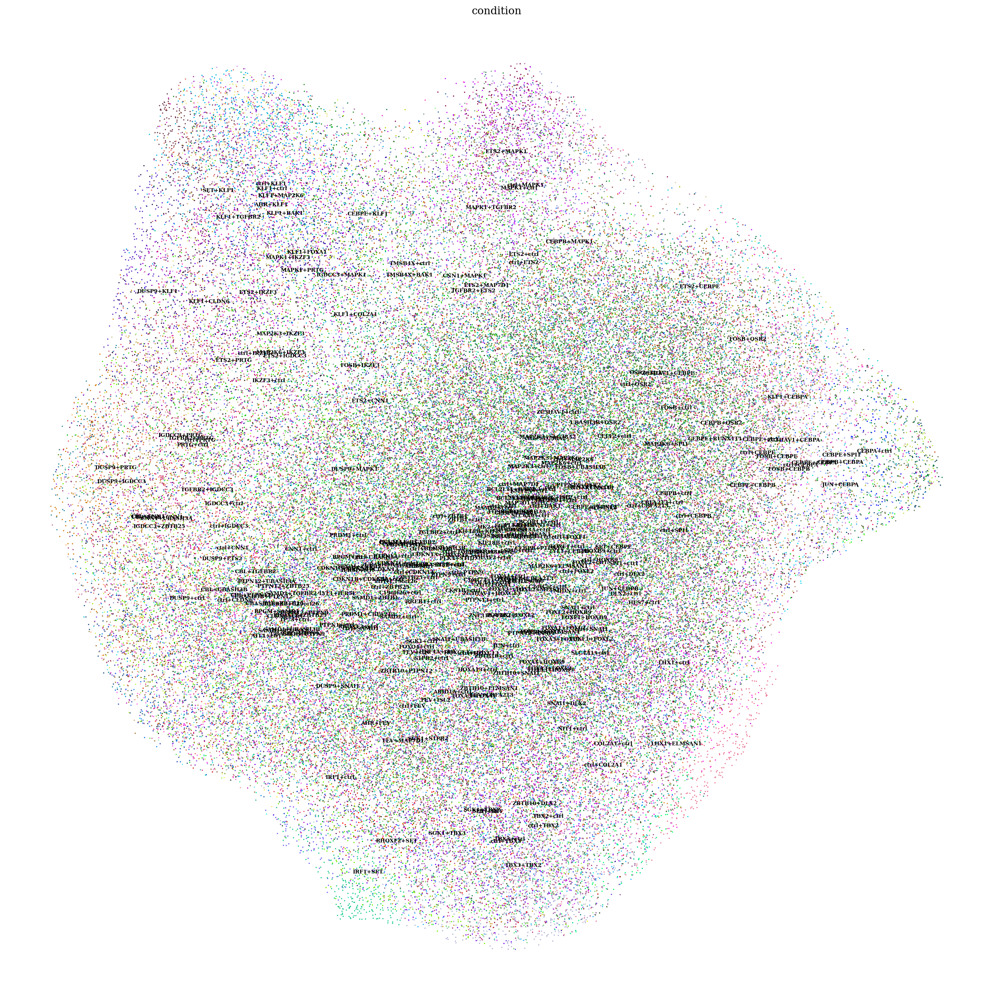

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

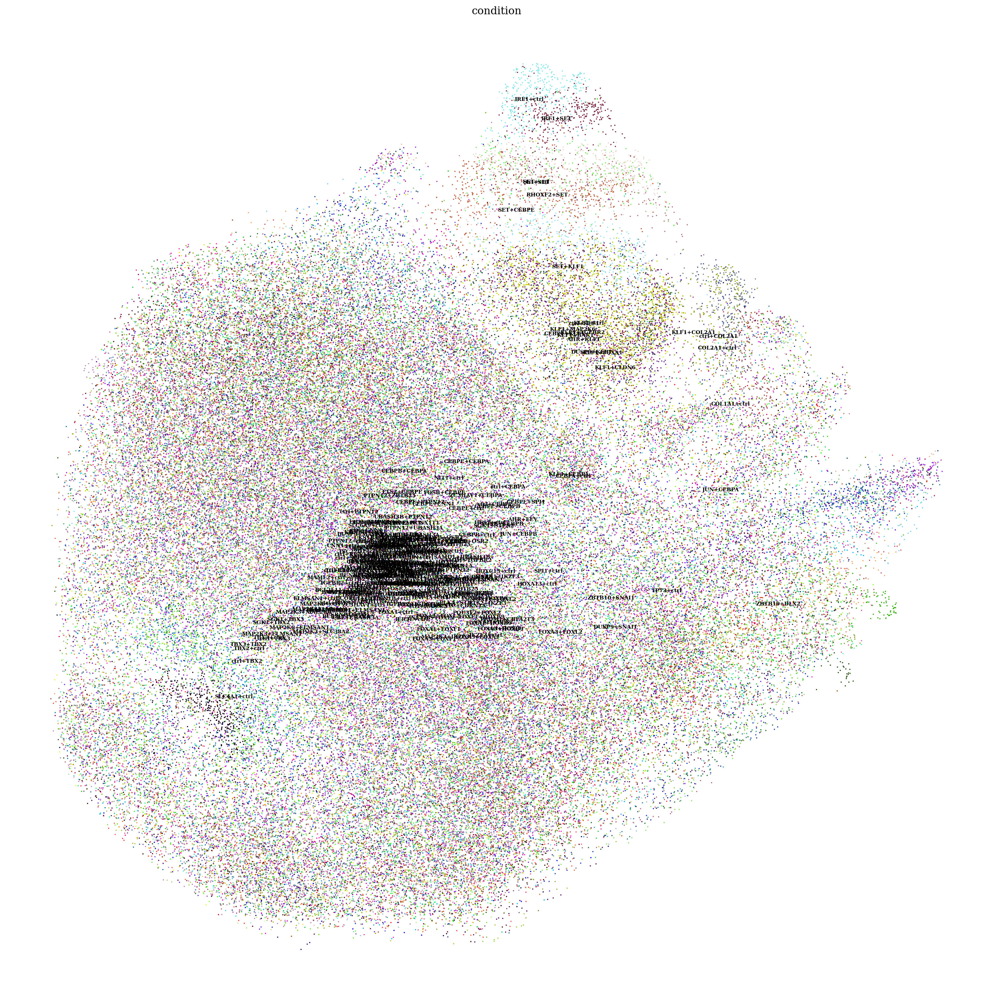

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()